In [1]:
!pip install kaggle
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"pankajkarki","key":"563115ce1ea9892ab835dfbe5b8acba1"}'}

In [2]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

# This permissions change avoids a warning on Kaggle tool startup.
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d pankajkarki/amazonfashion

!ls


 97% 465M/479M [00:06<00:00, 71.5MB/s]
100% 479M/479M [00:06<00:00, 78.1MB/s]
amazonfashion.zip  kaggle.json	sample_data


In [3]:
!kaggle datasets download -d aravind838/amazon-dress-dataset

!ls

  0% 0.00/104k [00:00<?, ?B/s]
100% 104k/104k [00:00<00:00, 32.5MB/s]
amazon-dress-dataset.zip  amazonfashion.zip  kaggle.json  sample_data


In [4]:
!unzip amazonfashion.zip
!unzip amazon-dress-dataset.zip

Archive:  amazonfashion.zip
  inflating: 16k_data_cnn_features.npy  
  inflating: 16k_apperal_data_preprocessed  
  inflating: word2vec_model          
Archive:  amazon-dress-dataset.zip
  inflating: 16k_data_cnn_feature_asins.npy  


In [5]:
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
from bs4 import BeautifulSoup
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import math
import time
import re
import os
import seaborn as sns
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity  
from sklearn.metrics import pairwise_distances
from matplotlib import gridspec
from scipy.sparse import hstack
import plotly
import plotly.figure_factory as ff
from plotly.graph_objs import Scatter, Layout

plotly.offline.init_notebook_mode(connected=True)
warnings.filterwarnings("ignore")

## Loading data

In [0]:
data = pd.read_pickle('16k_apperal_data_preprocessed')
asins = np.load('16k_data_cnn_feature_asins.npy')
image_data = np.load('16k_data_cnn_features.npy')
df_asins = list(data['asin'])
asins = list(asins)

In [0]:
import pickle
with open('word2vec_model', 'rb') as handle:
    model = pickle.load(handle)

In [8]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


## IDF values for titles

In [0]:
# Utility functions
def get_word_vec(sentence, doc_id, m_name):
    # sentence : title of the apparel
    # doc_id: document id in our corpus
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)
    vec = []
    for i in sentence.split():
        if i in vocab:
            if m_name == 'weighted' and i in  idf_title_vectorizer.vocabulary_:
                vec.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[i]] * model[i])
            elif m_name == 'avg':
                vec.append(model[i])
        else:
            # if the word in our courpus is not there in the google word2vec corpus, we are just ignoring it
            vec.append(np.zeros(shape=(300,)))
    # we will return a numpy array of shape (#number of words in title * 300 ) 300 = len(w2v_model[word])
    # each row represents the word2vec representation of each word (weighted/avg) in given sentance 
    return  np.array(vec)

def get_distance(vec1, vec2):
    # vec1 = np.array(#number_of_words_title1 * 300), each row is a vector of length 300 corresponds to each word in give title
    # vec2 = np.array(#number_of_words_title2 * 300), each row is a vector of length 300 corresponds to each word in give title
    
    final_dist = []
    # for each vector in vec1 we caluclate the distance(euclidean) to all vectors in vec2
    for i in vec1:
        dist = []
        for j in vec2:
            # np.linalg.norm(i-j) will result the euclidean distance between vectors i, j
            dist.append(np.linalg.norm(i-j))
        final_dist.append(np.array(dist))
    # final_dist = np.array(#number of words in title1 * #number of words in title2)
    # final_dist[i,j] = euclidean distance between vectors i, j
    return np.array(final_dist)
def heat_map_w2v_brand(sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2, model):
    
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # df_id1: index of document1 in the data frame
    # df_id2: index of document2 in the data frame
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentance1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title2 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentance2, doc_id2, model)
    
    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)
   
    data_matrix = [['Asin','Brand', 'Color', 'Product type'],
               [data['asin'].loc[df_id1],brands[doc_id1], colors[doc_id1], types[doc_id1]], # input apparel's features
               [data['asin'].loc[df_id2],brands[doc_id2], colors[doc_id2], types[doc_id2]]] # recommonded apparel's features
    
    colorscale = [[0, '#1d004d'],[.5, '#f2e5ff'],[1, '#f2e5d1']] # to color the headings of each column 
    
    # we create a table with the data_matrix
    table = ff.create_table(data_matrix, index=True, colorscale=colorscale)
    # plot it with plotly
    plotly.offline.iplot(table, filename='simple_table')
    
    # devide whole figure space into 25 * 1:10 grids
    gs = gridspec.GridSpec(25, 15)
    fig = plt.figure(figsize=(25,5))
    
    # in first 25*10 grids we plot heatmap
    ax1 = plt.subplot(gs[:, :-5])
    # ploting the heap map based on the pairwise distances
    ax1 = sns.heatmap(np.round(s1_s2_dist,6), annot=True)
    # set the x axis labels as recommended apparels title
    ax1.set_xticklabels(sentance2.split())
    # set the y axis labels as input apparels title
    ax1.set_yticklabels(sentance1.split())
    # set title as recommended apparels title
    ax1.set_title(sentance2)

    # in last 25 * 10:15 grids we display image
    ax2 = plt.subplot(gs[:, 10:16])
    # we dont display grid lins and axis labels to images
    ax2.grid(False)
    ax2.set_xticks([])
    ax2.set_yticks([])
    
    # pass the url it display it
    display_img(url, ax2, fig)
    
    plt.show()

In [0]:
idf_title_vectorizer = CountVectorizer()
idf_title_features = idf_title_vectorizer.fit_transform(data['title'])

# idf_title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(courpus) returns the a sparase matrix of dimensions #data_points * #words_in_corpus
# idf_title_features[doc_id, index_of_word_in_corpus] = number of times the word occured in that doc

In [0]:
vocab = model.keys()
# this function will add the vectors of each word and returns the avg vector of given sentance
def build_avg_vec(sentence, num_features, doc_id, m_name):
    # sentace: its title of the apparel
    # num_features: the lenght of word2vec vector, its values = 300
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)

    featureVec = np.zeros((num_features,), dtype="float32")
    # we will intialize a vector of size 300 with all zeros
    # we add each word2vec(wordi) to this fetureVec
    nwords = 0
    
    for word in sentence.split():
        nwords += 1
        if word in vocab:
            if m_name == 'weighted' and word in  idf_title_vectorizer.vocabulary_:
                featureVec = np.add(featureVec, idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[word]] * model[word])
            elif m_name == 'avg':
                featureVec = np.add(featureVec, model[word])
    if(nwords>0):
        featureVec = np.divide(featureVec, nwords)
    # returns the avg vector of given sentance, its of shape (1, 300)
    return featureVec

In [0]:
doc_id = 0
w2v_title_weight = []
# for every title we build a weighted vector representation
for i in data['title']:
    w2v_title_weight.append(build_avg_vec(i, 300, doc_id,'weighted'))
    doc_id += 1
# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title_weight = np.array(w2v_title_weight)
#print ("hi")

In [0]:
def display_img(url,ax,fig):
    # we get the url of the apparel and download it
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    # we will display it in notebook 
    plt.imshow(img)

## One_hot_encoding for brand, type and color

In [0]:
data['brand'].fillna(value="Not given", inplace=True )

# replace spaces with hypen
brands = [x.replace(" ", "-") for x in data['brand'].values]
types = [x.replace(" ", "-") for x in data['product_type_name'].values]
colors = [x.replace(" ", "-") for x in data['color'].values]

brand_vectorizer = CountVectorizer()
brand_features = brand_vectorizer.fit_transform(brands)

type_vectorizer = CountVectorizer()
type_features = type_vectorizer.fit_transform(types)

color_vectorizer = CountVectorizer()
color_features = color_vectorizer.fit_transform(colors)

extra_features = hstack((brand_features, type_features, color_features)).tocsr()

## Weighted euclidean distance similarity model with text, brand, color and image.

In [0]:
def idf_w2v_brand(doc_id, w1, w2, w3, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features
    # w3: weight for image

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    doc_id = asins.index(df_asins[doc_id])
    img_dist = pairwise_distances(image_data, image_data[doc_id].reshape(1,-1))
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist + w3 * img_dist)/float(w1 + w2 + w3)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)



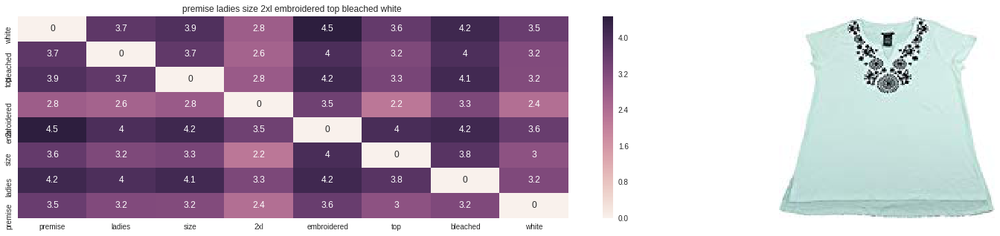

ASIN : B01M0IDUCV
Brand : Premise
euclidean distance from input : 2.469749218765685


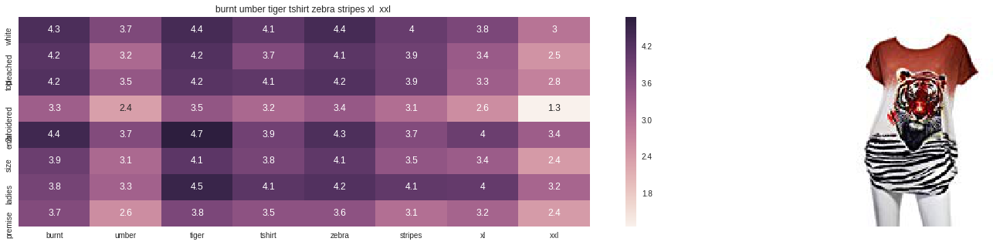

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 4.921850204467773


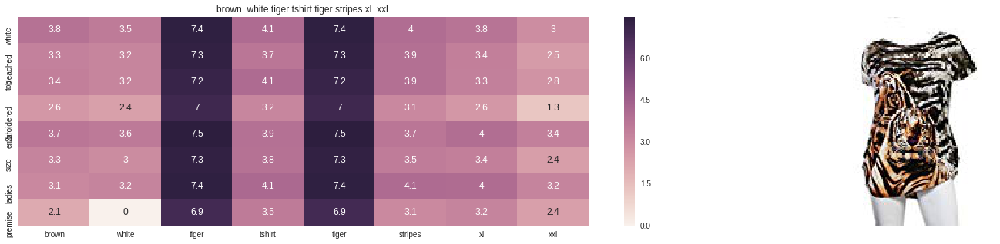

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from input : 5.036794712146123


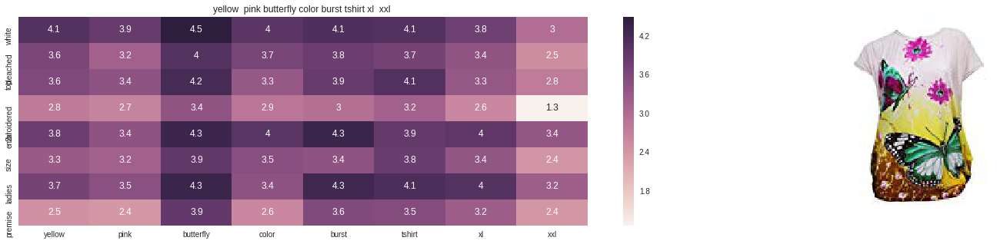

ASIN : B00JXQBBMI
Brand : Si Row
euclidean distance from input : 5.365263323290293


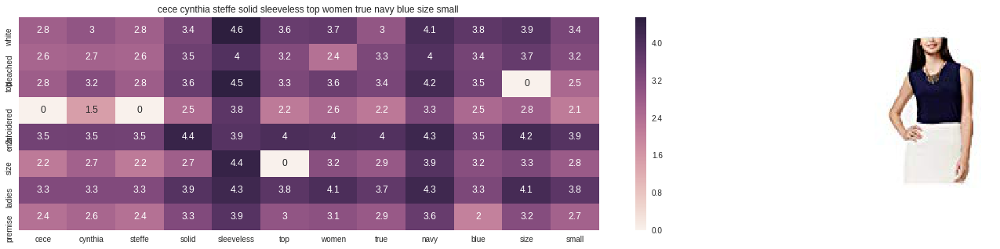

ASIN : B01N4NQ7LX
Brand : CeCe by Cynthia Steffe
euclidean distance from input : 5.3816651452952255


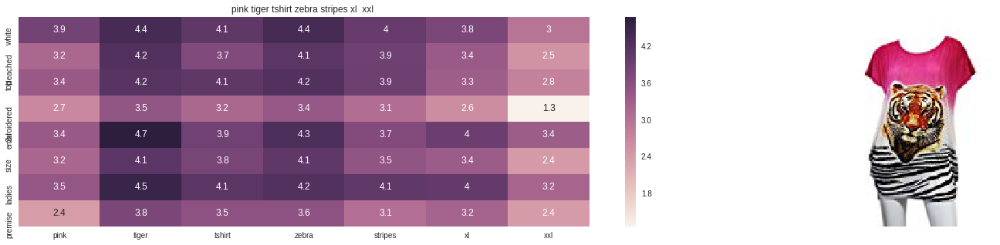

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 5.733815307719652


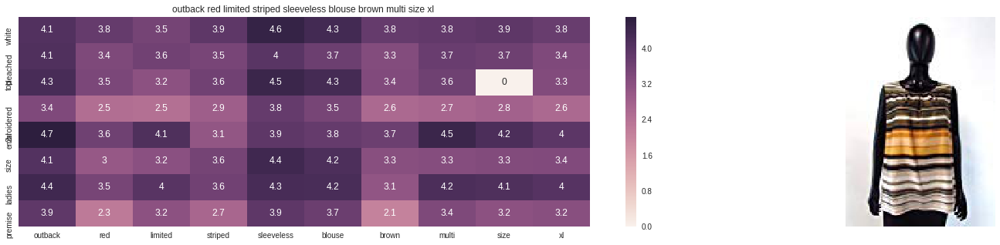

ASIN : B01IU645VU
Brand : Outback Red
euclidean distance from input : 5.75155015925635


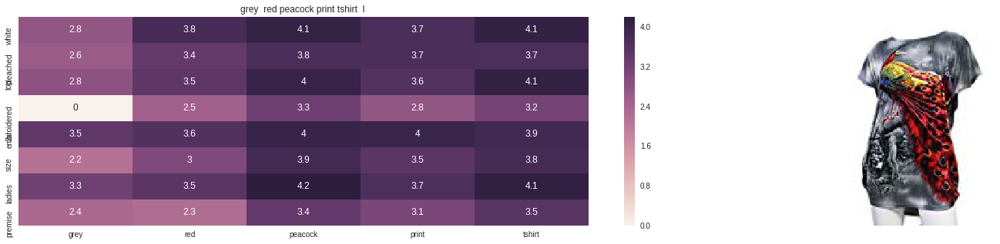

ASIN : B00JXQCFRS
Brand : Si Row
euclidean distance from input : 5.883681059184814


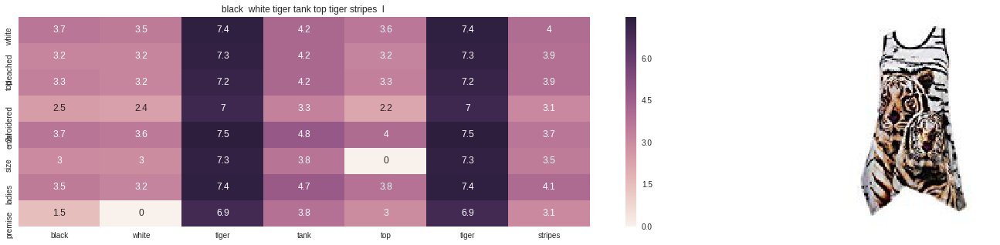

ASIN : B00JXQAO94
Brand : Si Row
euclidean distance from input : 5.915144572956507


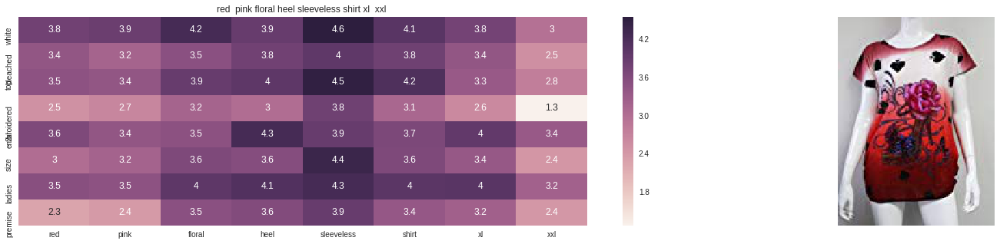

ASIN : B00JV63QQE
Brand : Si Row
euclidean distance from input : 5.980139166417861


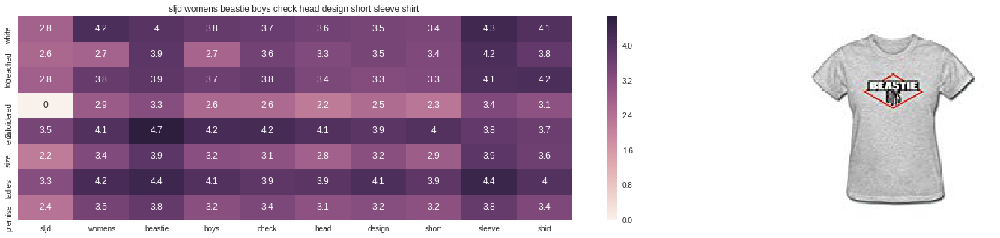

ASIN : B01FQLKKMK
Brand : SLJD
euclidean distance from input : 5.984168520967852


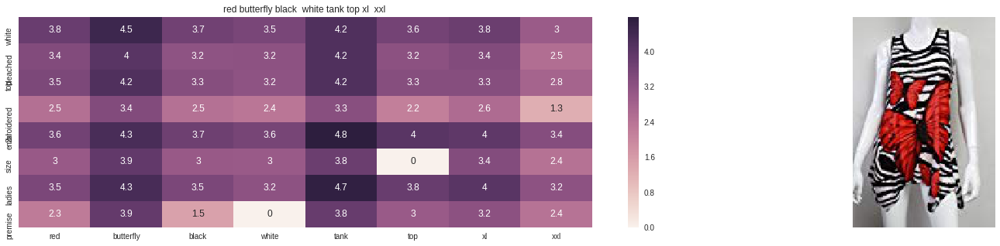

ASIN : B00JV63CW2
Brand : Si Row
euclidean distance from input : 6.0645703378350975


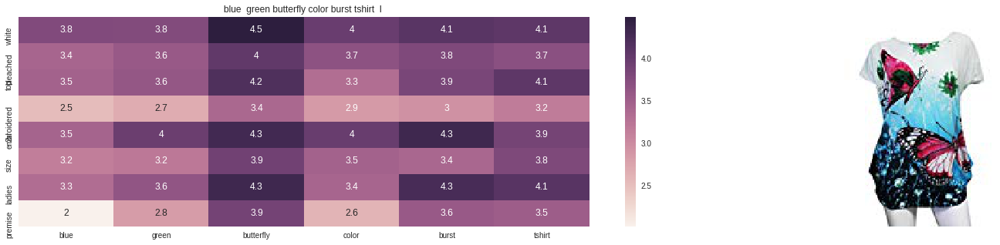

ASIN : B00JXQC0C8
Brand : Si Row
euclidean distance from input : 6.094723056061213


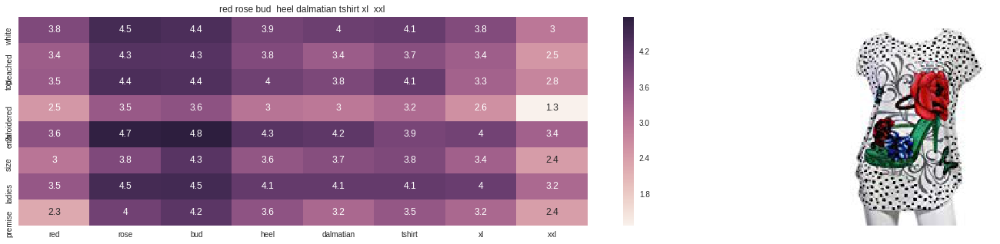

ASIN : B00JXQABB0
Brand : Si Row
euclidean distance from input : 6.099368959966445


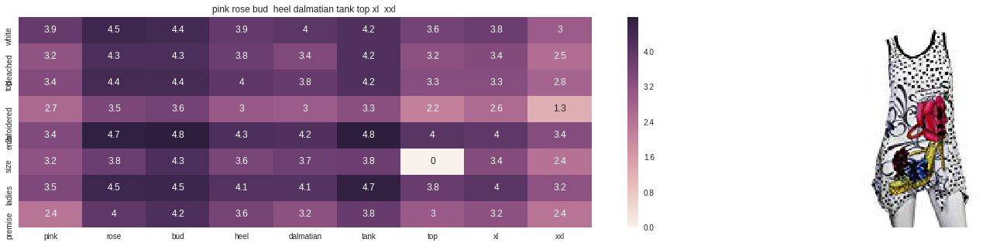

ASIN : B00JXQAX2C
Brand : Si Row
euclidean distance from input : 6.145332912905161


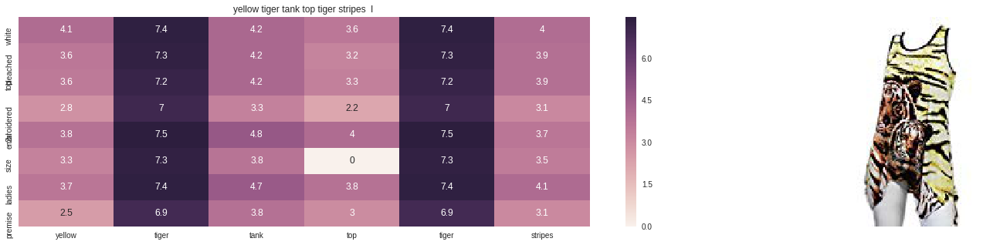

ASIN : B00JXQAUWA
Brand : Si Row
euclidean distance from input : 6.163847605688517


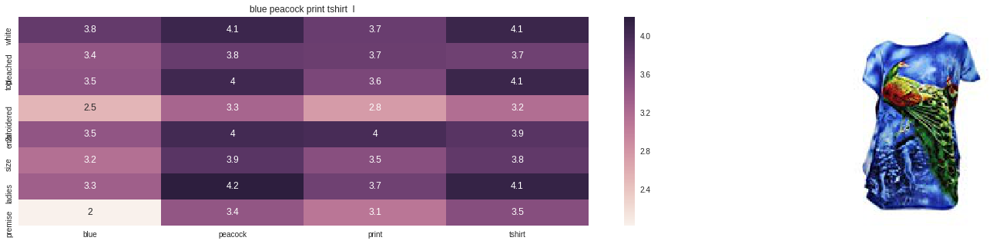

ASIN : B00JXQC8L6
Brand : Si Row
euclidean distance from input : 6.190271616283202


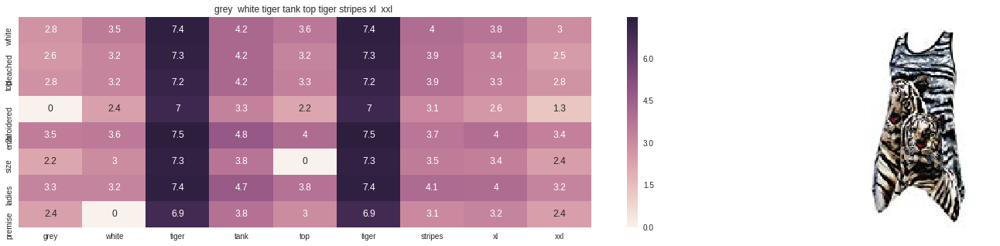

ASIN : B00JXQAFZ2
Brand : Si Row
euclidean distance from input : 6.230544785959665


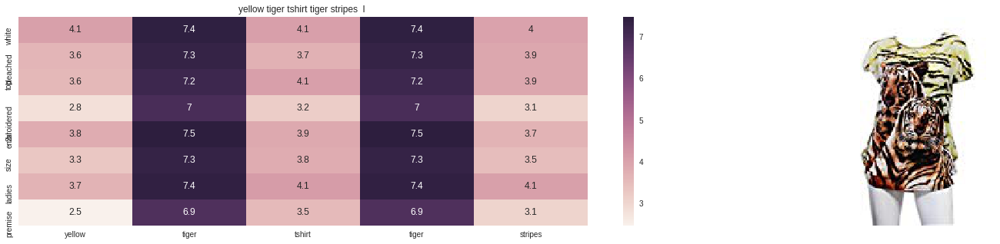

ASIN : B00JXQCUIC
Brand : Si Row
euclidean distance from input : 6.248712907535975


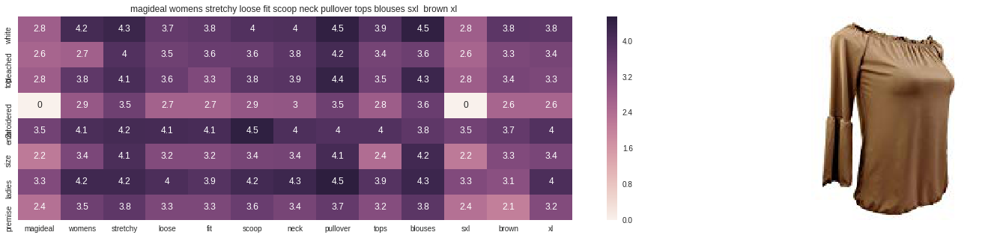

ASIN : B07515JFBF
Brand : MagiDeal
euclidean distance from input : 6.256056569476779


In [19]:
idf_w2v_brand(12566, 1, 10, 1, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

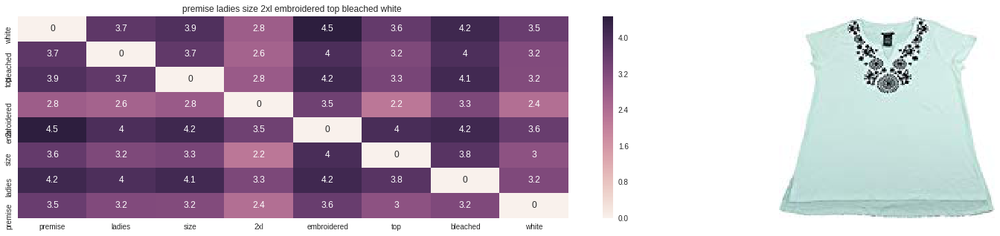

ASIN : B01M0IDUCV
Brand : Premise
euclidean distance from input : 1.3298227588317084


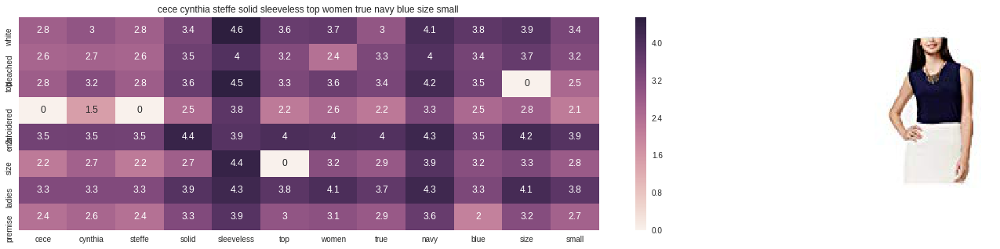

ASIN : B01N4NQ7LX
Brand : CeCe by Cynthia Steffe
euclidean distance from input : 3.9169546092487733


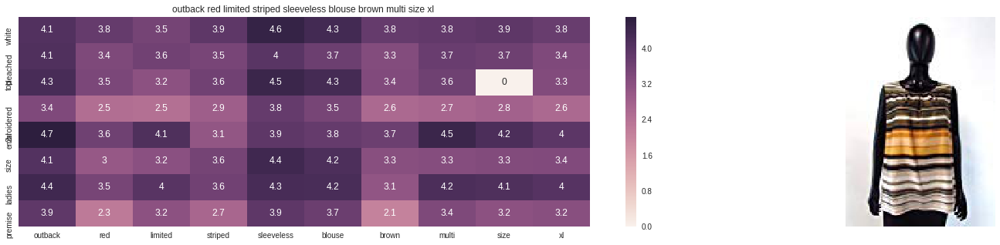

ASIN : B01IU645VU
Brand : Outback Red
euclidean distance from input : 4.742219076693126


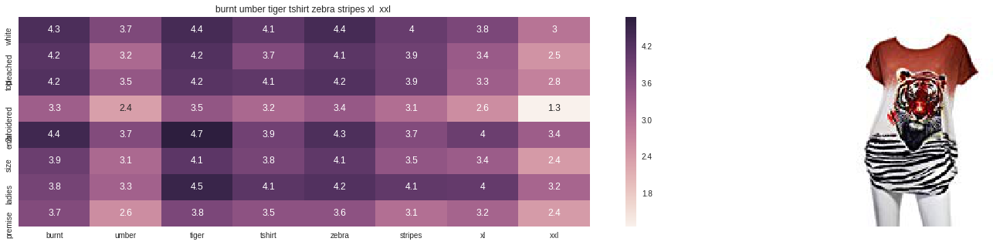

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 4.921850204467773


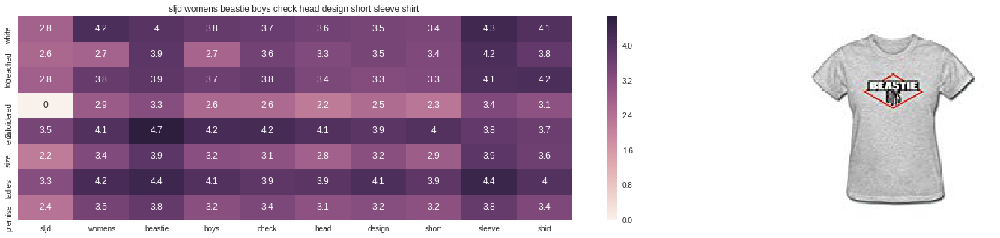

ASIN : B01FQLKKMK
Brand : SLJD
euclidean distance from input : 5.014088100334077


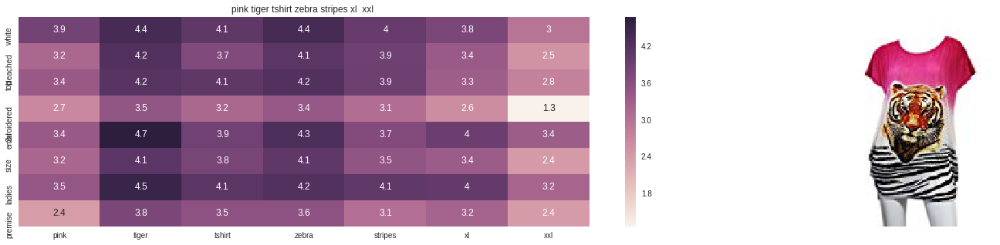

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 5.115049751629744


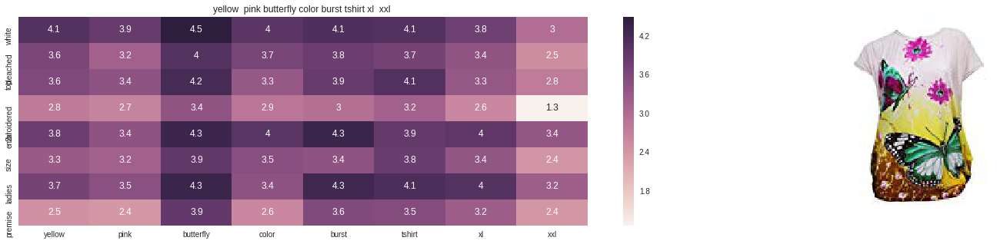

ASIN : B00JXQBBMI
Brand : Si Row
euclidean distance from input : 5.146877002746179


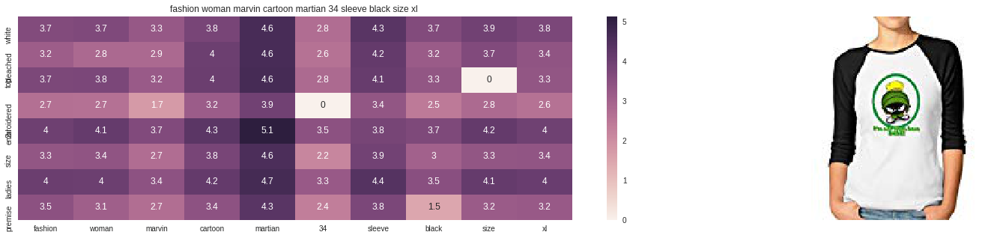

ASIN : B01FRPIX2Y
Brand : LOVELIF Sleeve Raglan
euclidean distance from input : 5.264321804046631


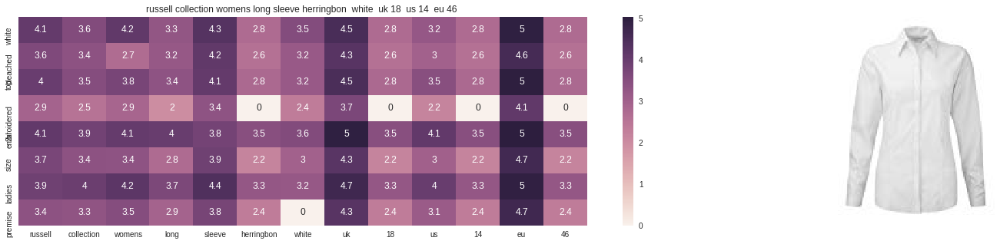

ASIN : B00K77AN5S
Brand : Russell Collection
euclidean distance from input : 5.26985445028606


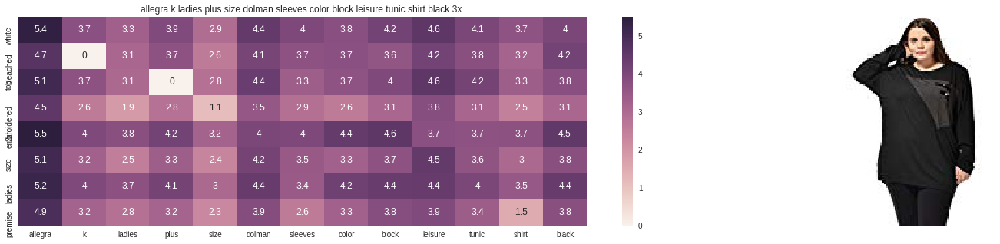

ASIN : B00D2J5HPO
Brand : Kaia
euclidean distance from input : 5.285154050727754


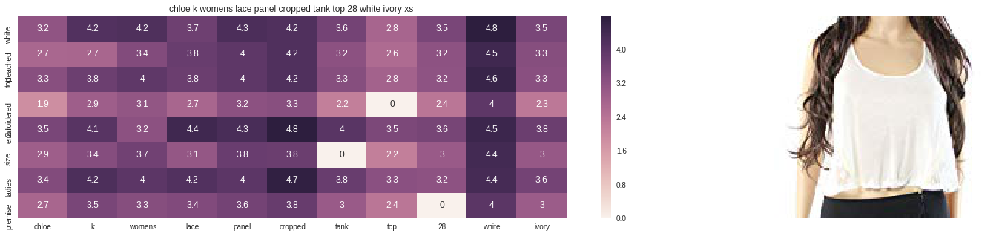

ASIN : B071VZCT5W
Brand : Chloe K.
euclidean distance from input : 5.301563088159392


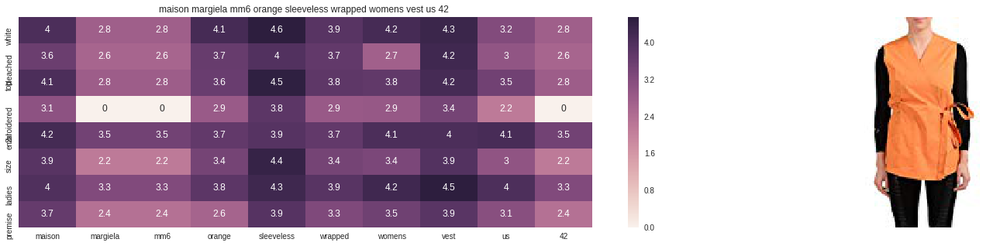

ASIN : B01MXI5L4G
Brand : Maison Margiela MM6
euclidean distance from input : 5.308324257532756


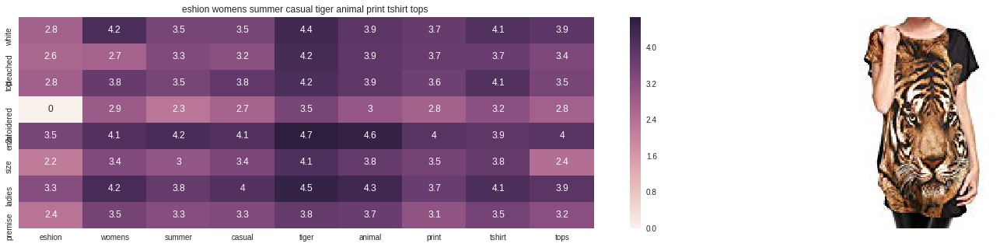

ASIN : B01EXZQR4K
Brand : eshion
euclidean distance from input : 5.371108834009


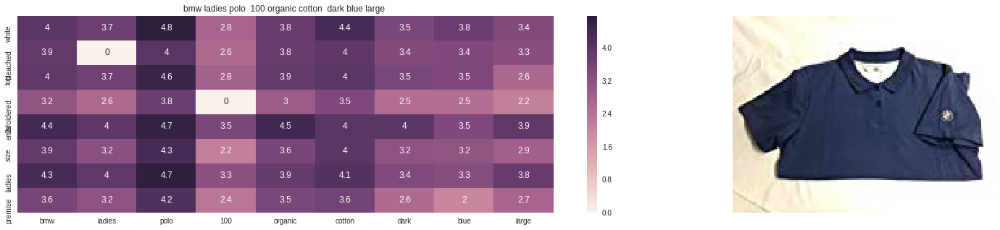

ASIN : B0060MKVX8
Brand : Not given
euclidean distance from input : 5.3715933005617345


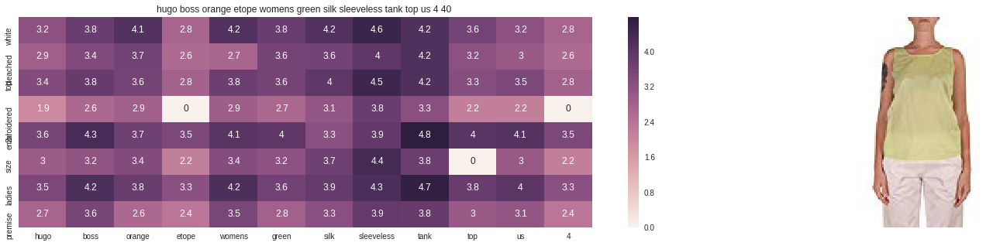

ASIN : B00WTE3XC2
Brand : HUGO BOSS
euclidean distance from input : 5.371755504668383


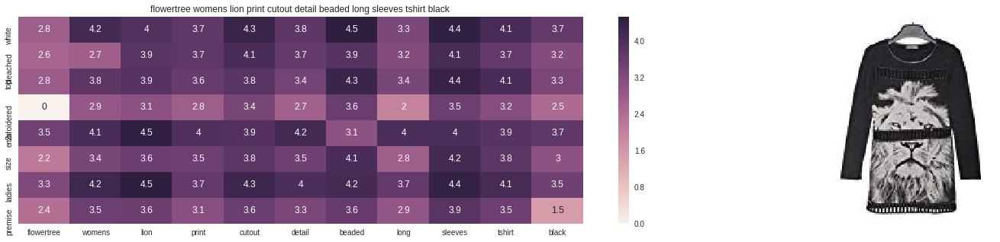

ASIN : B00XKXT9N8
Brand : flowertree
euclidean distance from input : 5.372366533815929


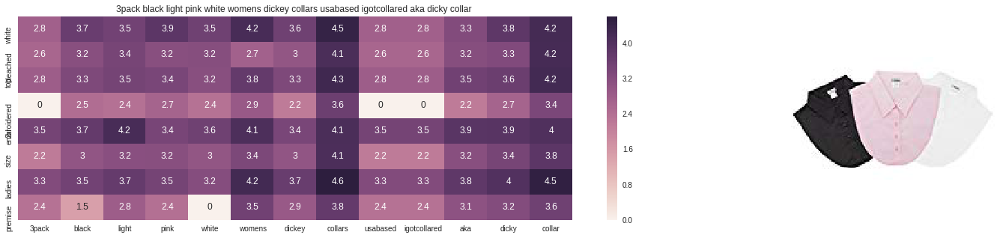

ASIN : B01N2W9P7A
Brand : IGotCollared Pronounced I Got Collared
euclidean distance from input : 5.375417058880701


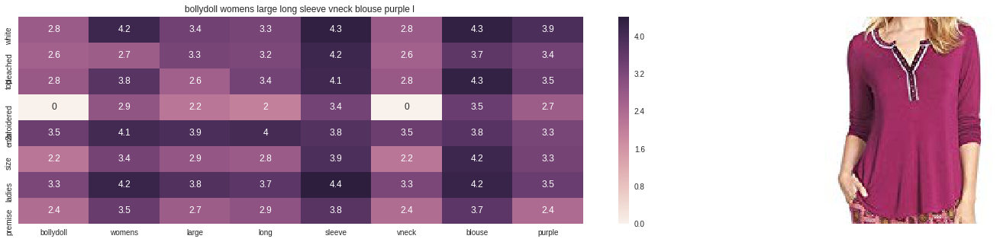

ASIN : B074MJPLCB
Brand : BollyDoll
euclidean distance from input : 5.3831638754805615


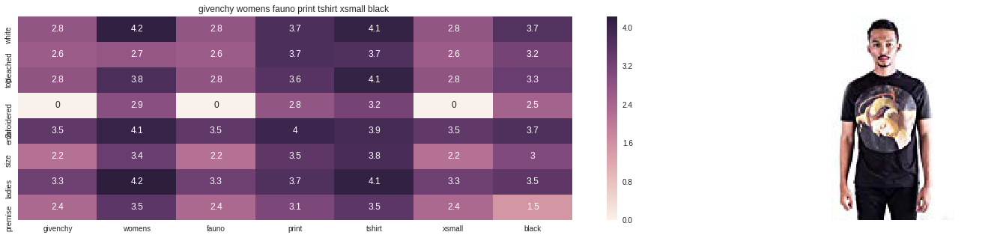

ASIN : B01IT7ETXO
Brand : Givenchy
euclidean distance from input : 5.383778915941783


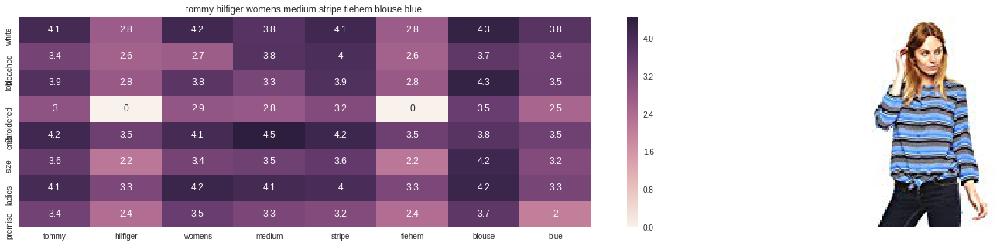

ASIN : B01LWXIM7E
Brand : Tommy Hilfiger
euclidean distance from input : 5.388658507725228


In [20]:
idf_w2v_brand(12566, 10, 1, 1, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

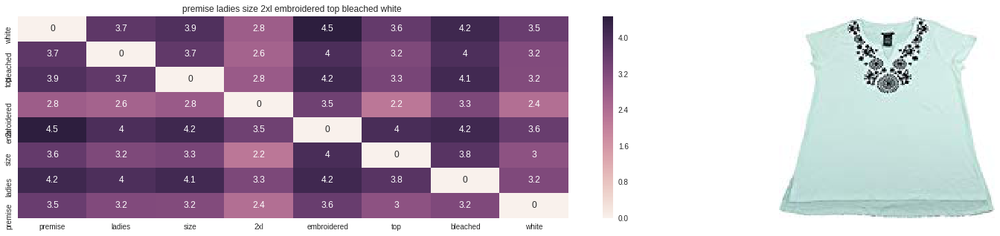

ASIN : B01M0IDUCV
Brand : Premise
euclidean distance from input : 0.38157450562778


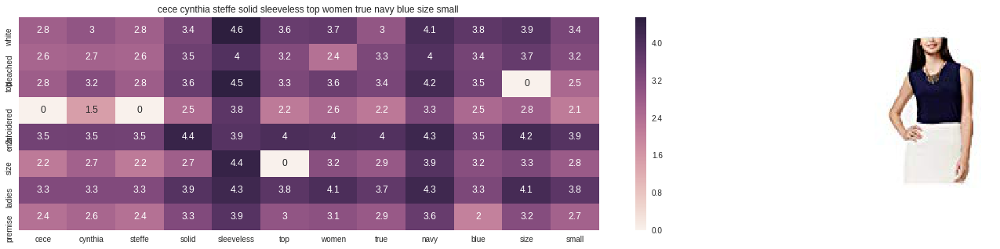

ASIN : B01N4NQ7LX
Brand : CeCe by Cynthia Steffe
euclidean distance from input : 25.431737624102567


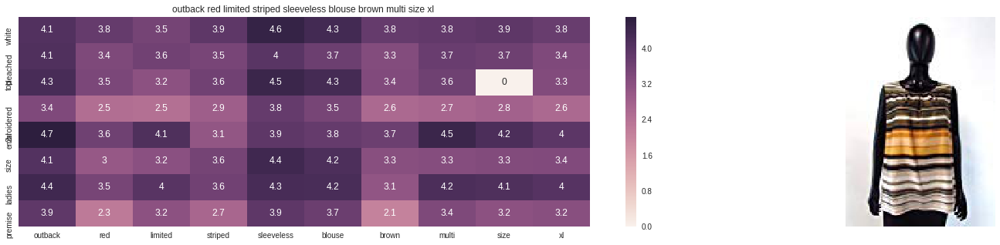

ASIN : B01IU645VU
Brand : Outback Red
euclidean distance from input : 34.7130702000261


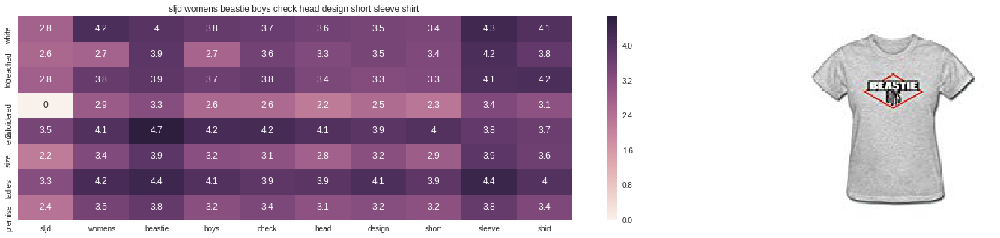

ASIN : B01FQLKKMK
Brand : SLJD
euclidean distance from input : 37.00000381086277


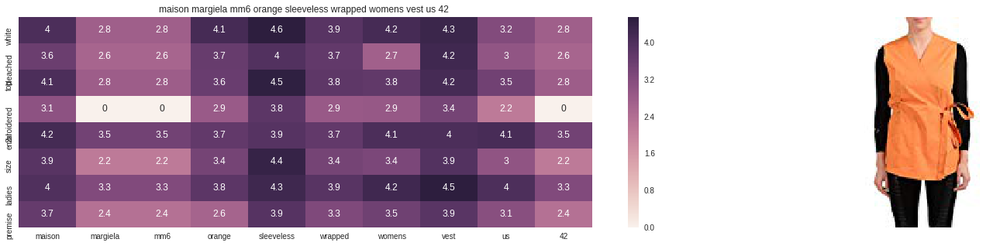

ASIN : B01MXI5L4G
Brand : Maison Margiela MM6
euclidean distance from input : 39.84640347957611


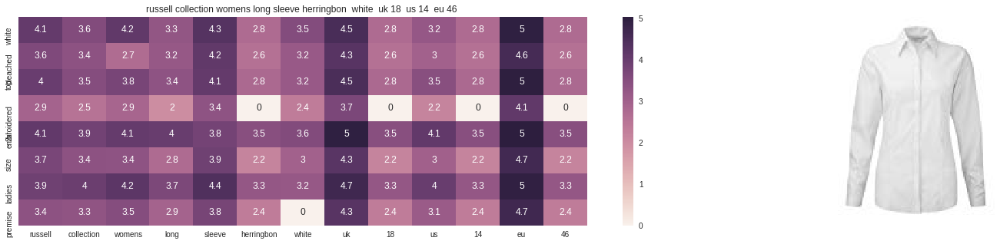

ASIN : B00K77AN5S
Brand : Russell Collection
euclidean distance from input : 40.10678912605905


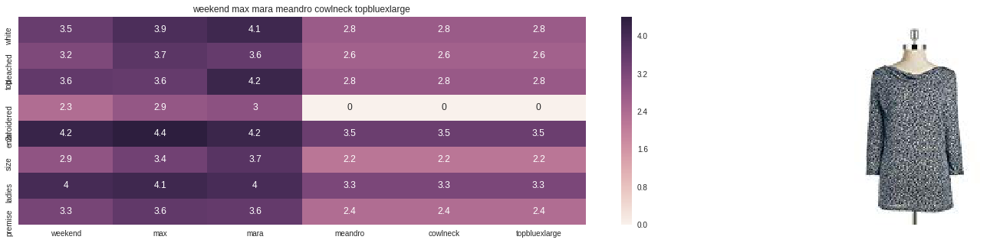

ASIN : B01MG83UB4
Brand : MaxMara
euclidean distance from input : 40.26092523946372


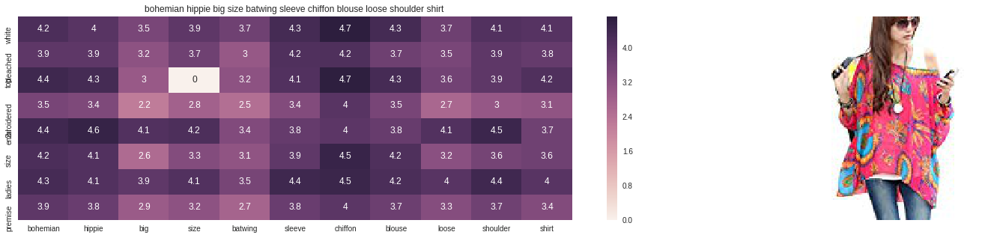

ASIN : B00YC92VRU
Brand : Display Promotion
euclidean distance from input : 40.38671579573559


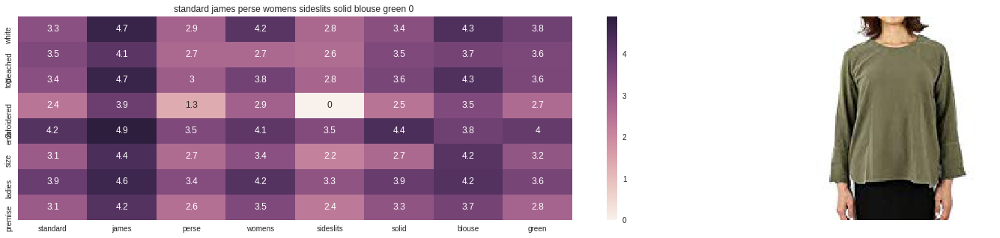

ASIN : B071LMW4YG
Brand : Standard James Perse
euclidean distance from input : 40.448933601379395


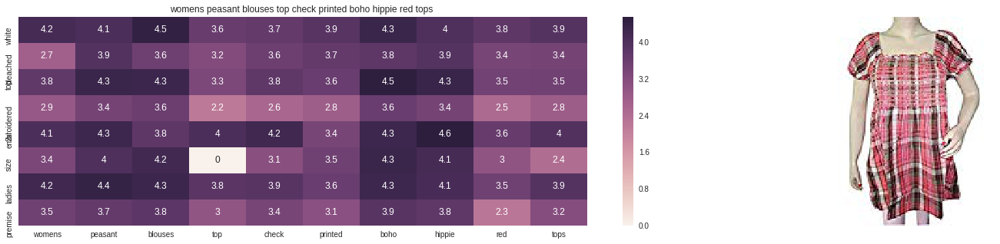

ASIN : B01MXMG6KB
Brand : Mogul Interior
euclidean distance from input : 40.466360910793775


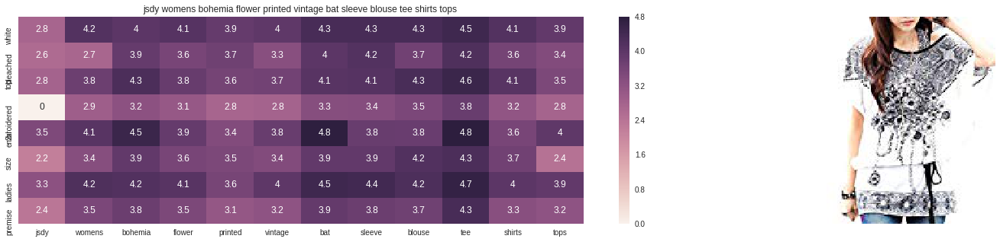

ASIN : B00L8RE3PC
Brand : JSDY-Cloth
euclidean distance from input : 40.49264034038845


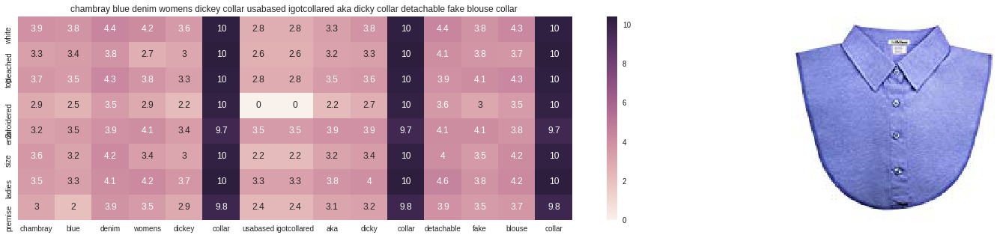

ASIN : B01MQWKWME
Brand : IGotCollared
euclidean distance from input : 40.531203170617424


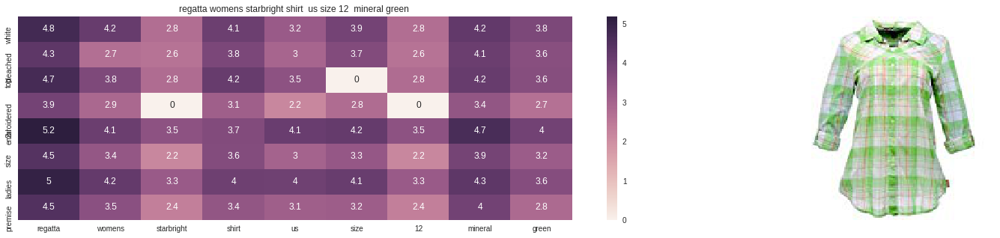

ASIN : B017EC8BOI
Brand : Regatta
euclidean distance from input : 40.56862028843227


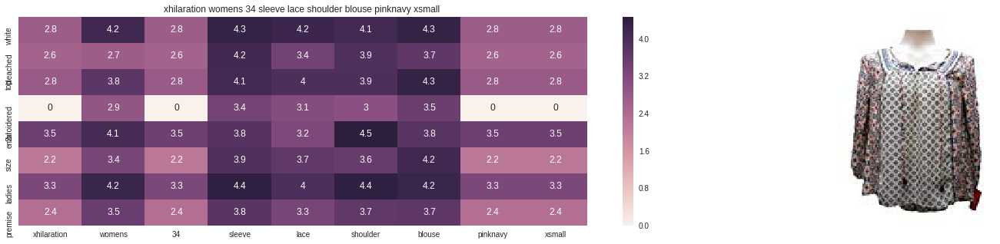

ASIN : B06ZYLKPRT
Brand : Xhilaration
euclidean distance from input : 40.57731591071748


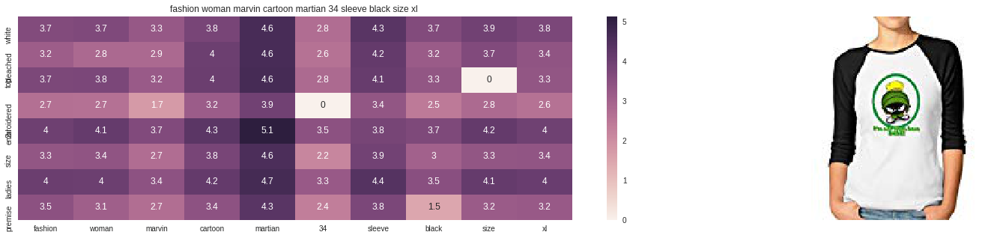

ASIN : B01FRPIX2Y
Brand : LOVELIF Sleeve Raglan
euclidean distance from input : 40.65056265393893


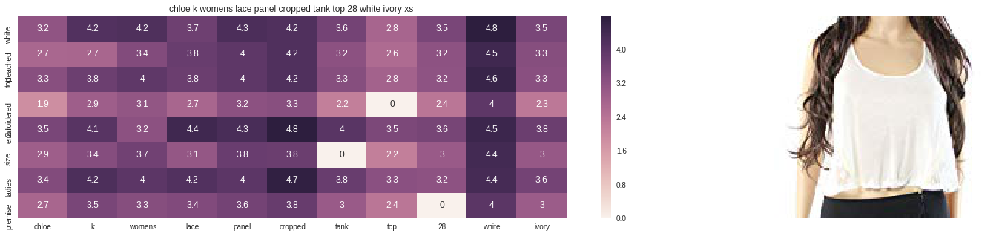

ASIN : B071VZCT5W
Brand : Chloe K.
euclidean distance from input : 40.65879850989643


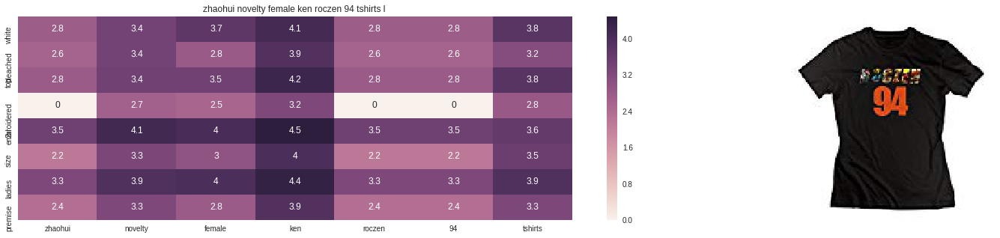

ASIN : B017EEVCV0
Brand : ZhaoHui
euclidean distance from input : 40.73372021927443


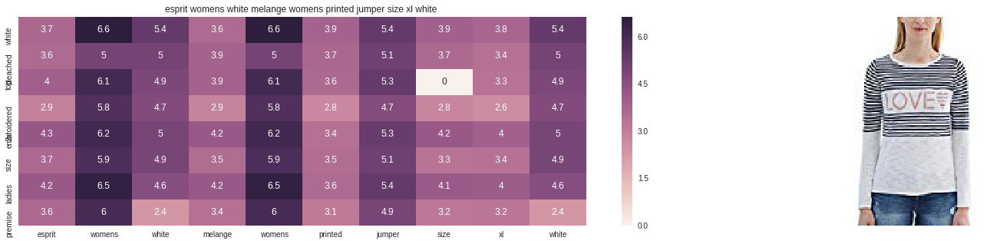

ASIN : B01MSZ1EO7
Brand : Esprit
euclidean distance from input : 40.77127275864283


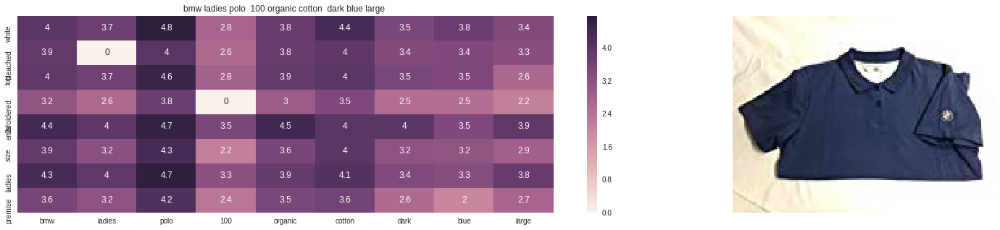

ASIN : B0060MKVX8
Brand : Not given
euclidean distance from input : 40.80962766613626


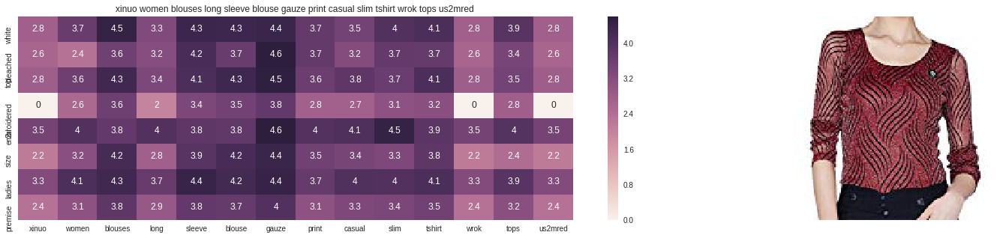

ASIN : B01MU874KK
Brand : XINUO
euclidean distance from input : 40.85555603716778


In [21]:
idf_w2v_brand(12566, 1, 1, 10, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

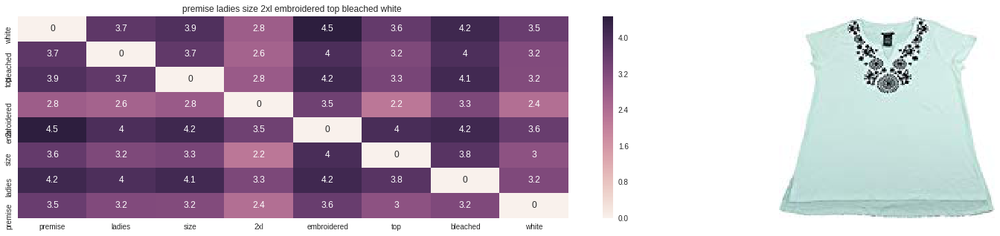

ASIN : B01M0IDUCV
Brand : Premise
euclidean distance from input : 1.3937154931252356


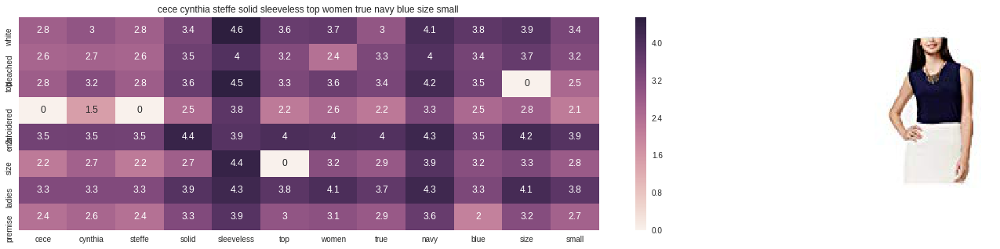

ASIN : B01N4NQ7LX
Brand : CeCe by Cynthia Steffe
euclidean distance from input : 11.576785709435686


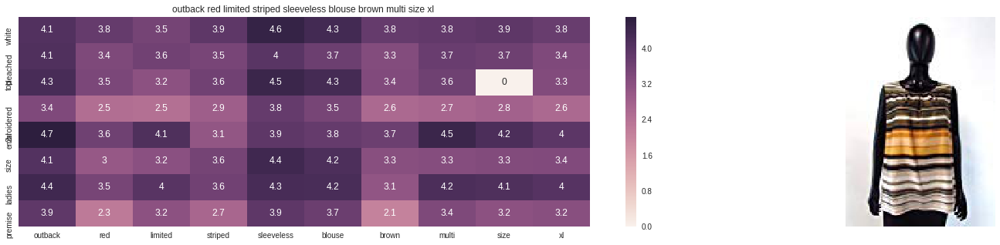

ASIN : B01IU645VU
Brand : Outback Red
euclidean distance from input : 15.068946433623905


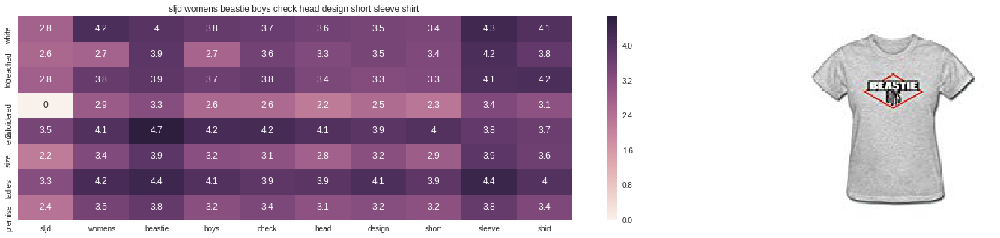

ASIN : B01FQLKKMK
Brand : SLJD
euclidean distance from input : 15.99942014273035


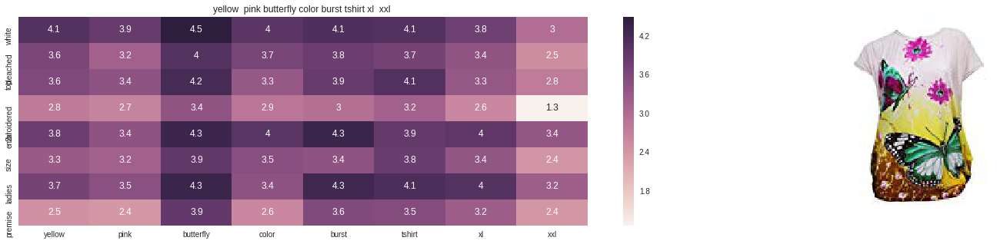

ASIN : B00JXQBBMI
Brand : Si Row
euclidean distance from input : 17.218412844460467


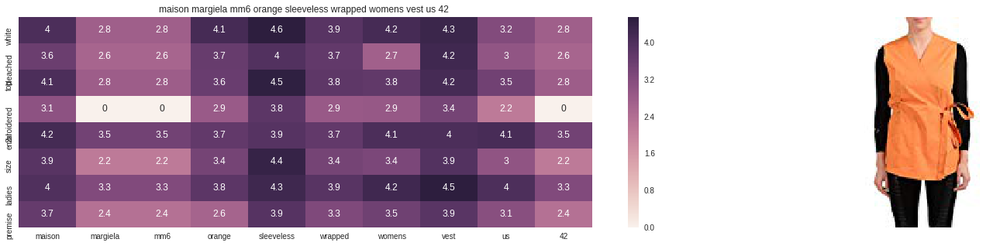

ASIN : B01MXI5L4G
Brand : Maison Margiela MM6
euclidean distance from input : 17.238082790374754


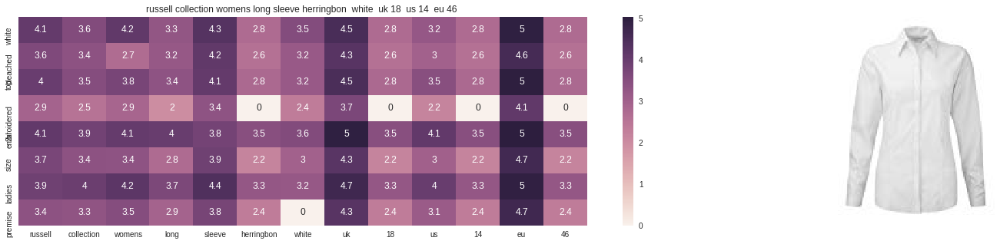

ASIN : B00K77AN5S
Brand : Russell Collection
euclidean distance from input : 17.271986834449088


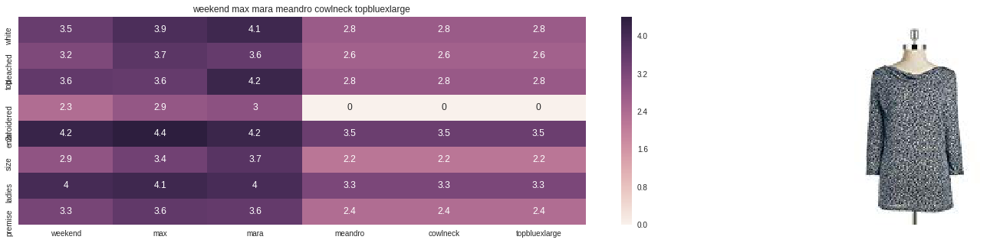

ASIN : B01MG83UB4
Brand : MaxMara
euclidean distance from input : 17.337402129729863


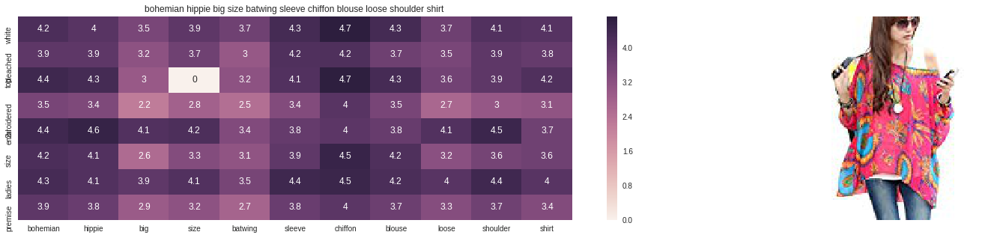

ASIN : B00YC92VRU
Brand : Display Promotion
euclidean distance from input : 17.407464989582973


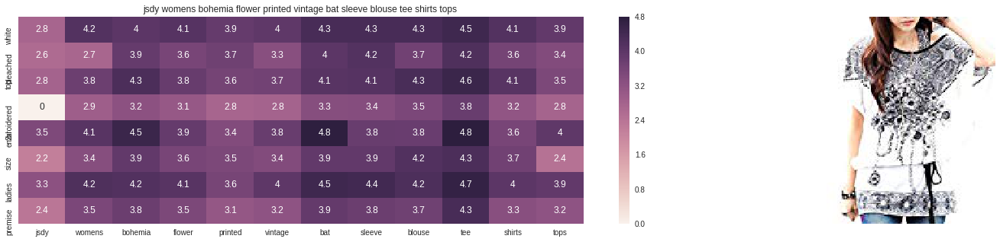

ASIN : B00L8RE3PC
Brand : JSDY-Cloth
euclidean distance from input : 17.462214788042026


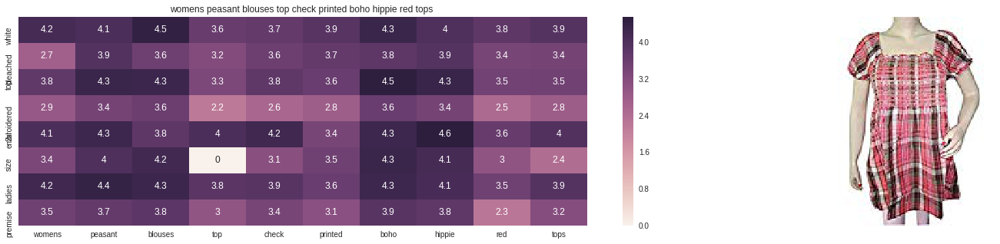

ASIN : B01MXMG6KB
Brand : Mogul Interior
euclidean distance from input : 17.471602090440705


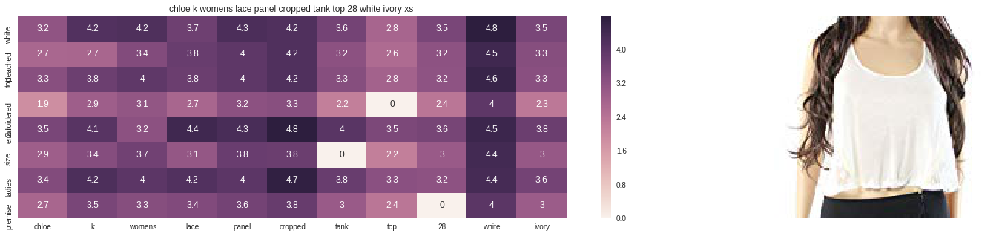

ASIN : B071VZCT5W
Brand : Chloe K.
euclidean distance from input : 17.484248002611118


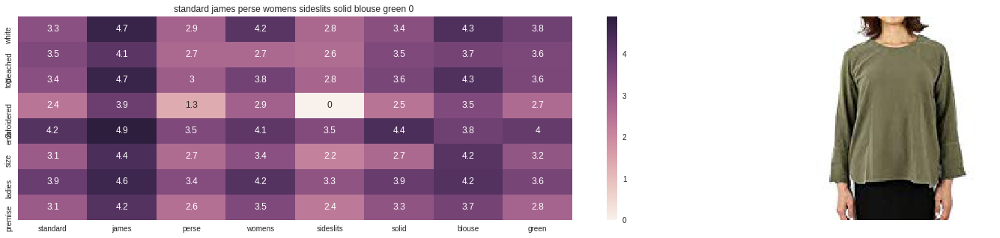

ASIN : B071LMW4YG
Brand : Standard James Perse
euclidean distance from input : 17.490113067626954


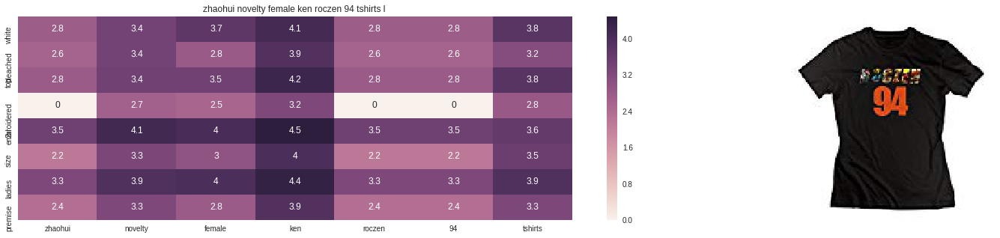

ASIN : B017EEVCV0
Brand : ZhaoHui
euclidean distance from input : 17.498198740244185


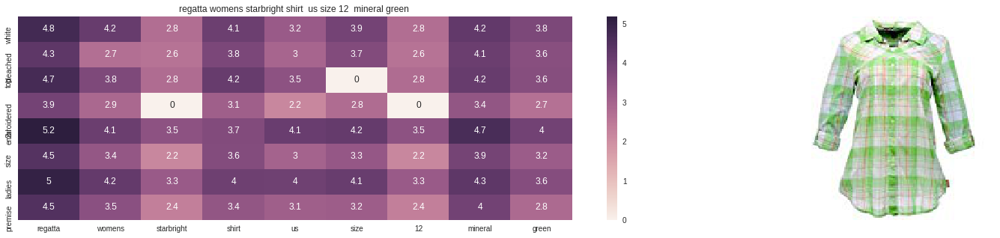

ASIN : B017EC8BOI
Brand : Regatta
euclidean distance from input : 17.504147275529817


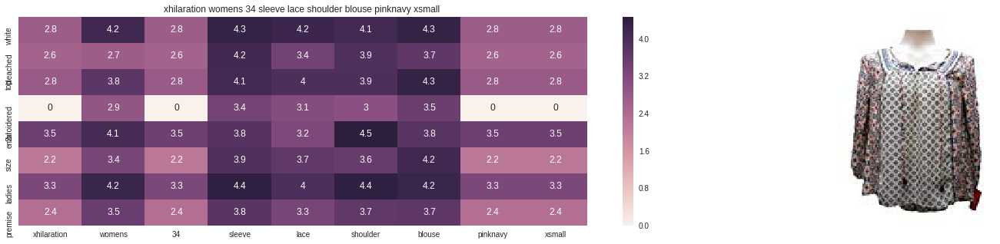

ASIN : B06ZYLKPRT
Brand : Xhilaration
euclidean distance from input : 17.51233371122928


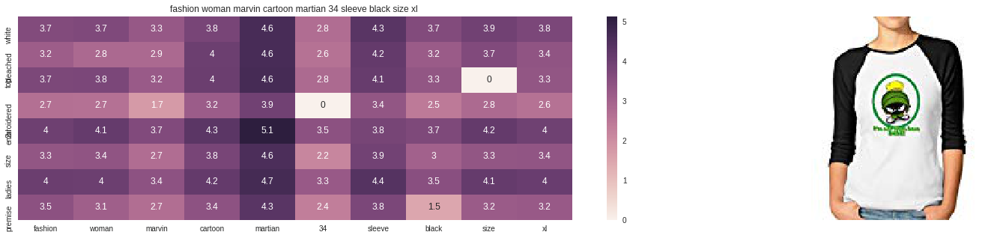

ASIN : B01FRPIX2Y
Brand : LOVELIF Sleeve Raglan
euclidean distance from input : 17.51450341542562


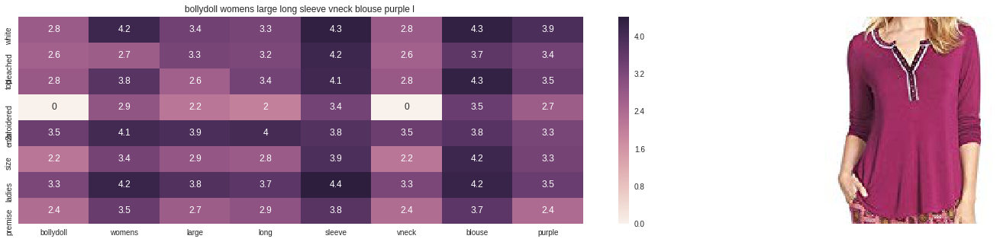

ASIN : B074MJPLCB
Brand : BollyDoll
euclidean distance from input : 17.549009426991418


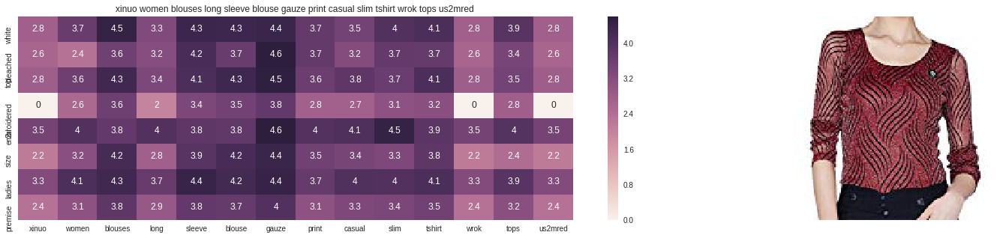

ASIN : B01MU874KK
Brand : XINUO
euclidean distance from input : 17.549567898671107


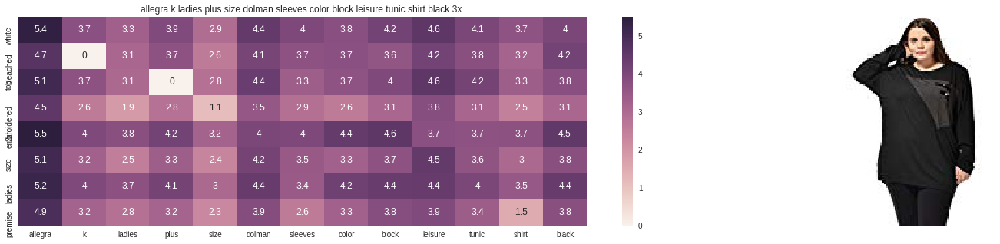

ASIN : B00D2J5HPO
Brand : Kaia
euclidean distance from input : 17.55401809271204


In [22]:
idf_w2v_brand(12566, 10, 10, 10, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

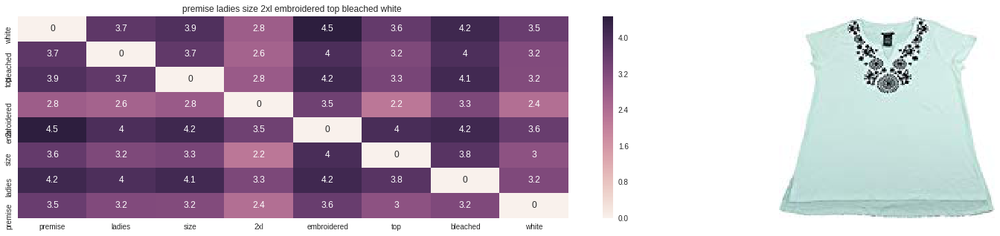

ASIN : B01M0IDUCV
Brand : Premise
euclidean distance from input : 1.3724179150480893


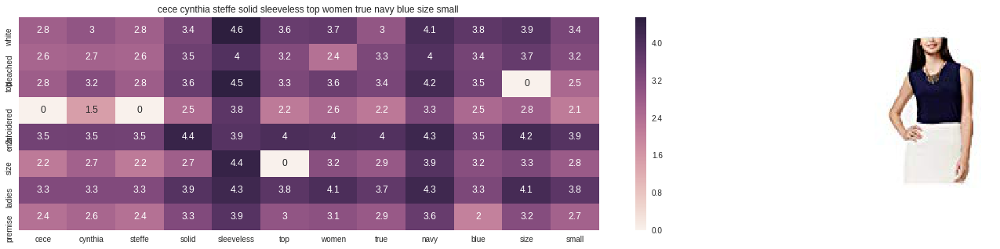

ASIN : B01N4NQ7LX
Brand : CeCe by Cynthia Steffe
euclidean distance from input : 9.023508633654524


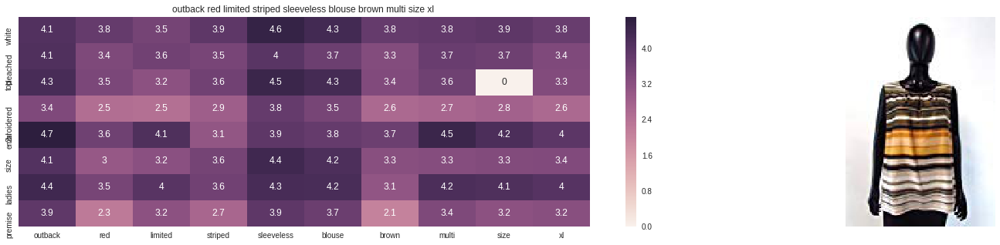

ASIN : B01IU645VU
Brand : Outback Red
euclidean distance from input : 11.626703960120883


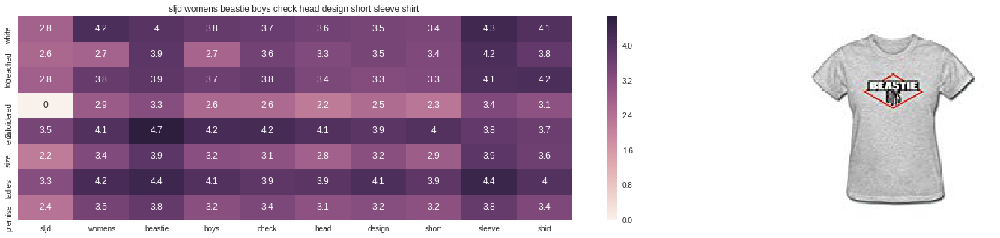

ASIN : B01FQLKKMK
Brand : SLJD
euclidean distance from input : 12.337642795264927


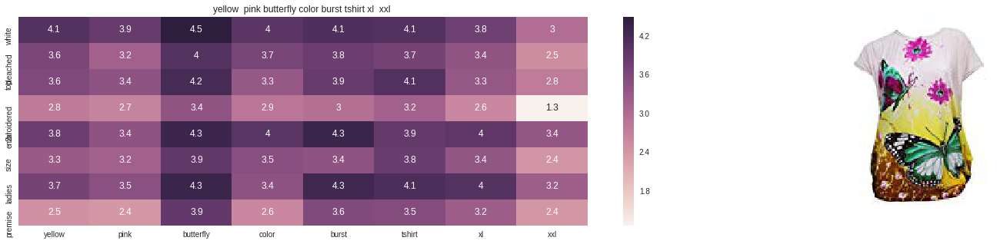

ASIN : B00JXQBBMI
Brand : Si Row
euclidean distance from input : 13.1945675850818


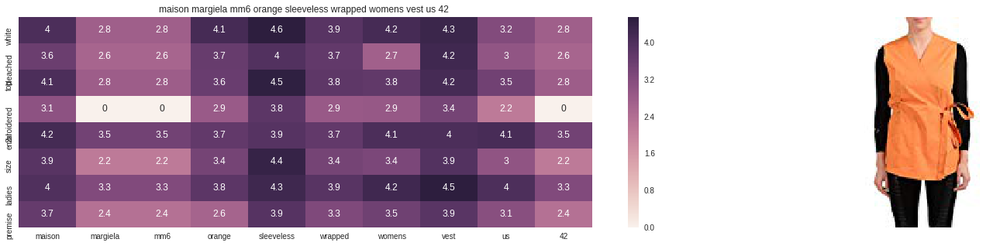

ASIN : B01MXI5L4G
Brand : Maison Margiela MM6
euclidean distance from input : 13.261496591567994


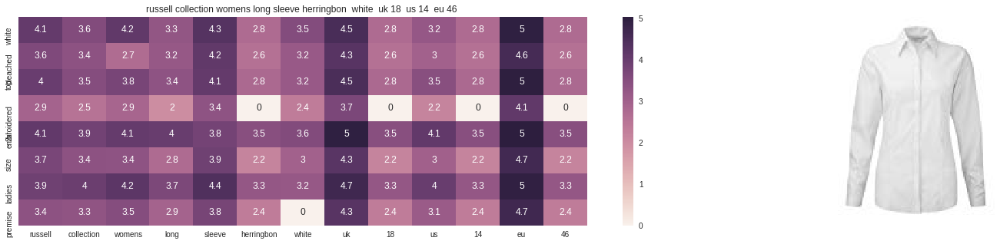

ASIN : B00K77AN5S
Brand : Russell Collection
euclidean distance from input : 13.271275997342553


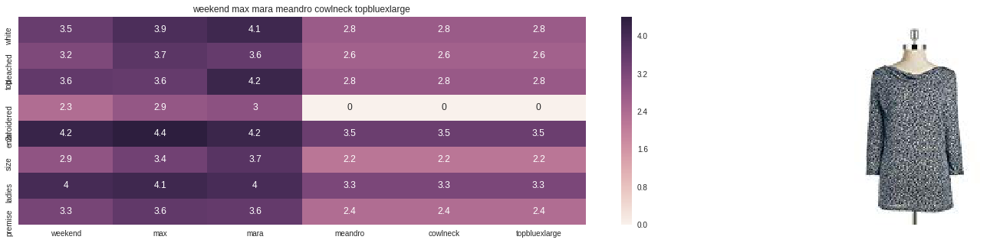

ASIN : B01MG83UB4
Brand : MaxMara
euclidean distance from input : 13.369140464484897


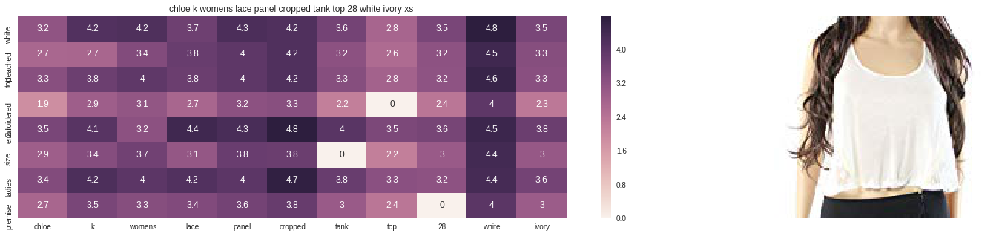

ASIN : B071VZCT5W
Brand : Chloe K.
euclidean distance from input : 13.423353052319971


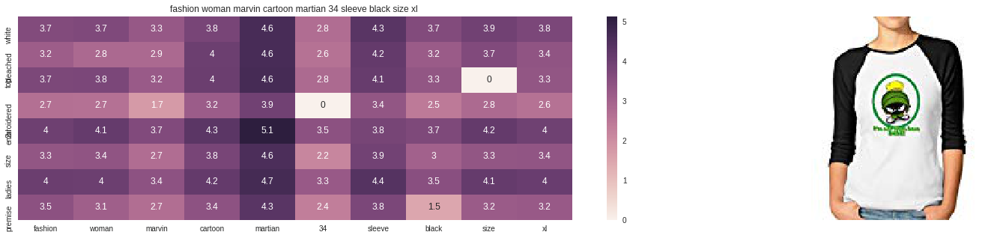

ASIN : B01FRPIX2Y
Brand : LOVELIF Sleeve Raglan
euclidean distance from input : 13.431109523773193


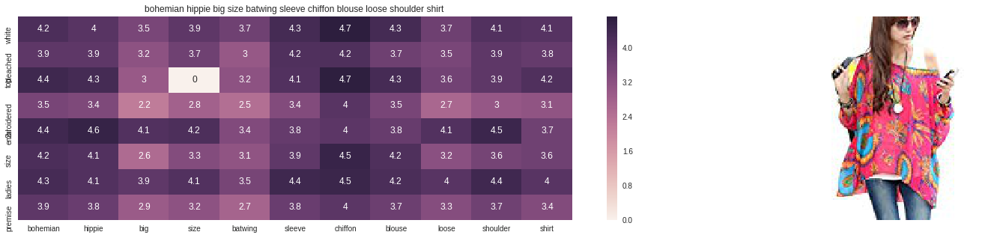

ASIN : B00YC92VRU
Brand : Display Promotion
euclidean distance from input : 13.43814314049503


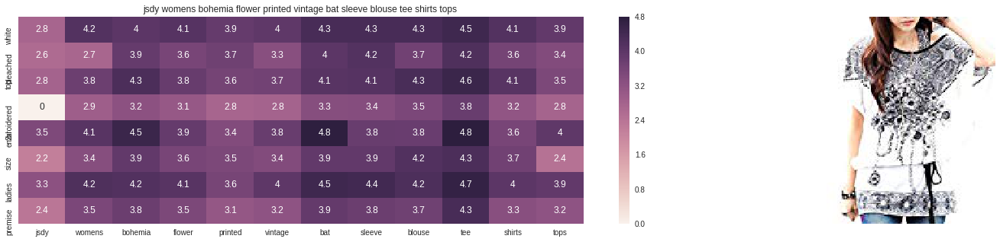

ASIN : B00L8RE3PC
Brand : JSDY-Cloth
euclidean distance from input : 13.443853187741723


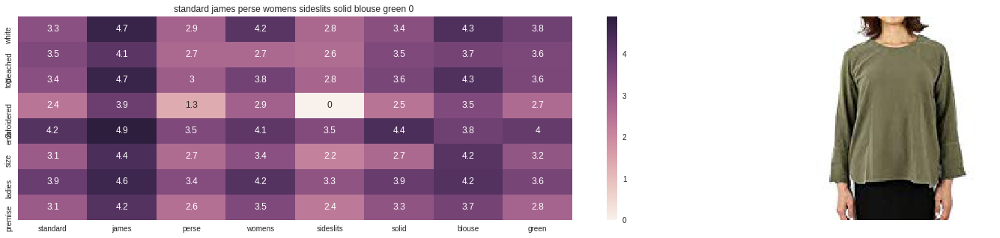

ASIN : B071LMW4YG
Brand : Standard James Perse
euclidean distance from input : 13.45970115661621


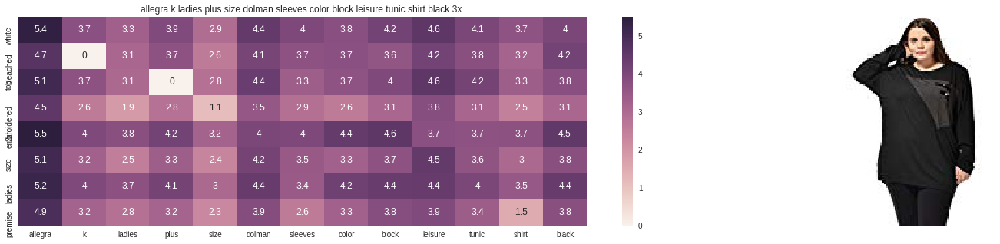

ASIN : B00D2J5HPO
Brand : Kaia
euclidean distance from input : 13.464396745383945


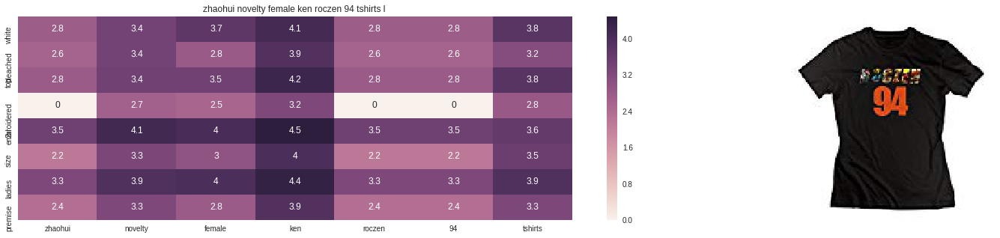

ASIN : B017EEVCV0
Brand : ZhaoHui
euclidean distance from input : 13.466136771857943


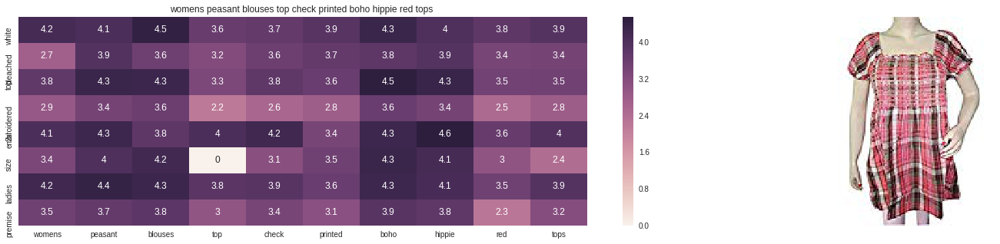

ASIN : B01MXMG6KB
Brand : Mogul Interior
euclidean distance from input : 13.46747622507998


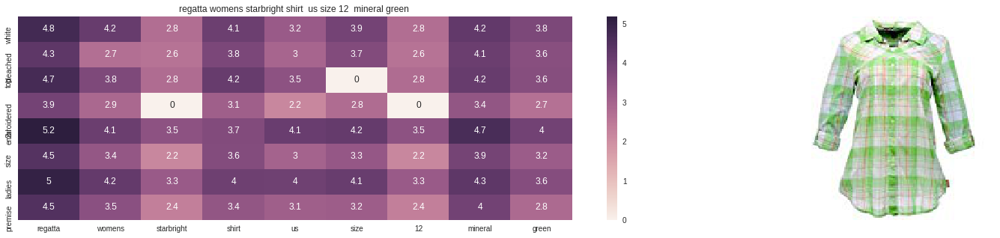

ASIN : B017EC8BOI
Brand : Regatta
euclidean distance from input : 13.484919643582788


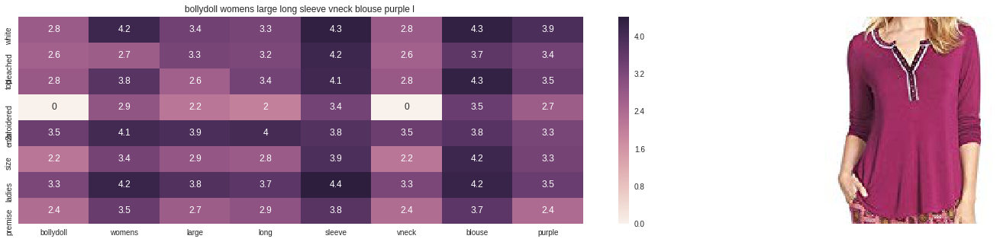

ASIN : B074MJPLCB
Brand : BollyDoll
euclidean distance from input : 13.493727618873326


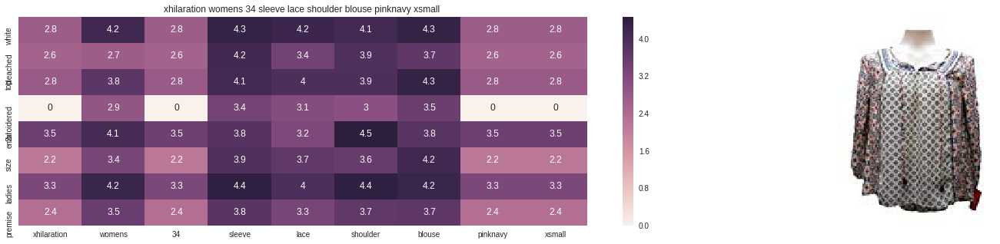

ASIN : B06ZYLKPRT
Brand : Xhilaration
euclidean distance from input : 13.494982958020653


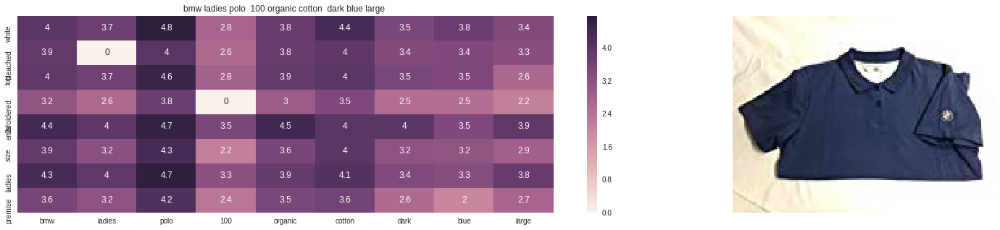

ASIN : B0060MKVX8
Brand : Not given
euclidean distance from input : 13.500238084973779


In [23]:
idf_w2v_brand(12566, 10, 5, 5, 20)

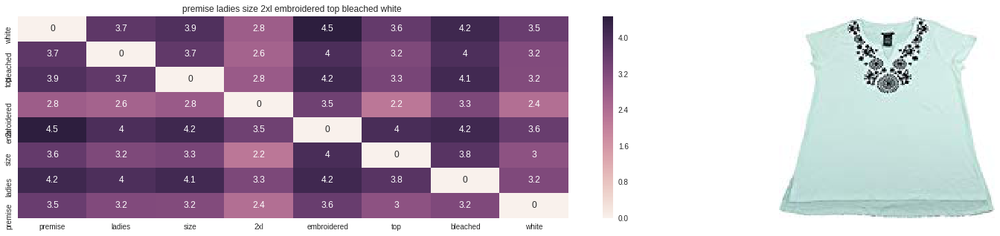

ASIN : B01M0IDUCV
Brand : Premise
euclidean distance from input : 0.04419417381286621


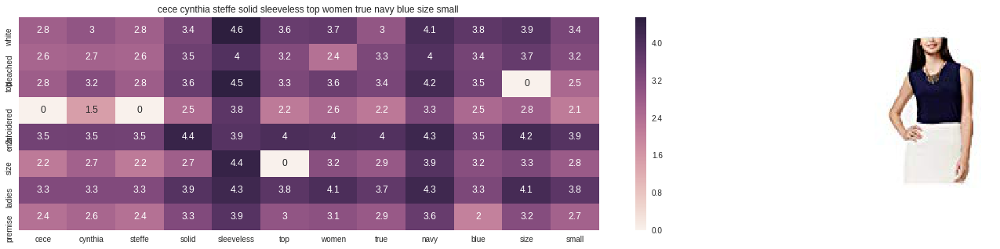

ASIN : B01N4NQ7LX
Brand : CeCe by Cynthia Steffe
euclidean distance from input : 30.050054931640624


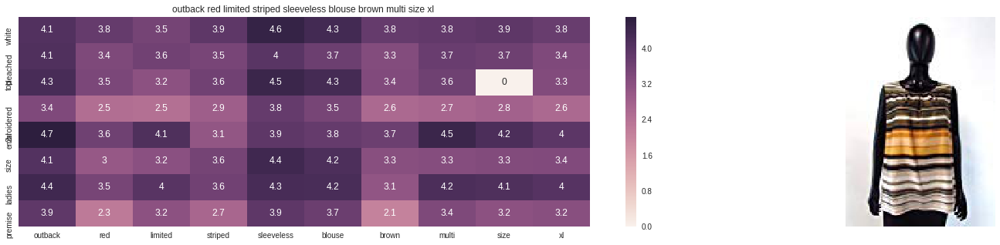

ASIN : B01IU645VU
Brand : Outback Red
euclidean distance from input : 41.261111450195315


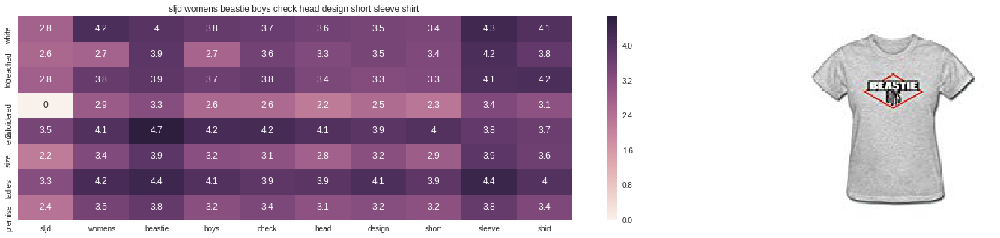

ASIN : B01FQLKKMK
Brand : SLJD
euclidean distance from input : 44.00019836425781


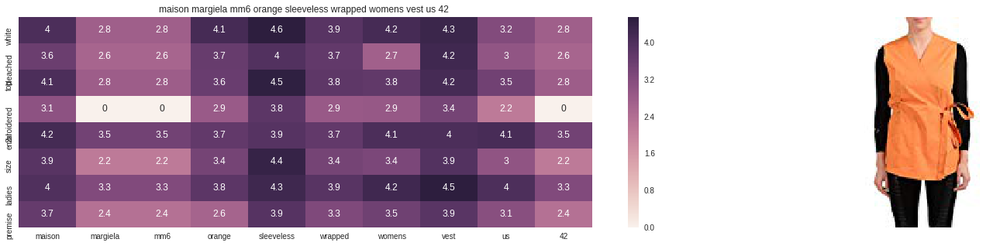

ASIN : B01MXI5L4G
Brand : Maison Margiela MM6
euclidean distance from input : 47.382510375976565


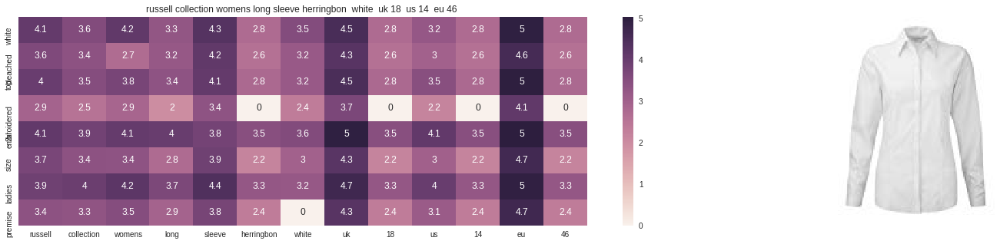

ASIN : B00K77AN5S
Brand : Russell Collection
euclidean distance from input : 47.718389892578124


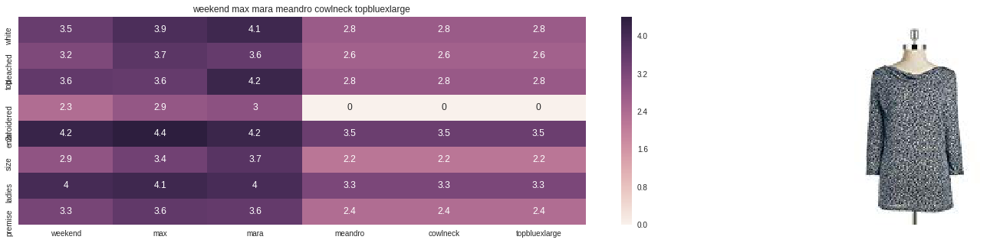

ASIN : B01MG83UB4
Brand : MaxMara
euclidean distance from input : 47.902099609375


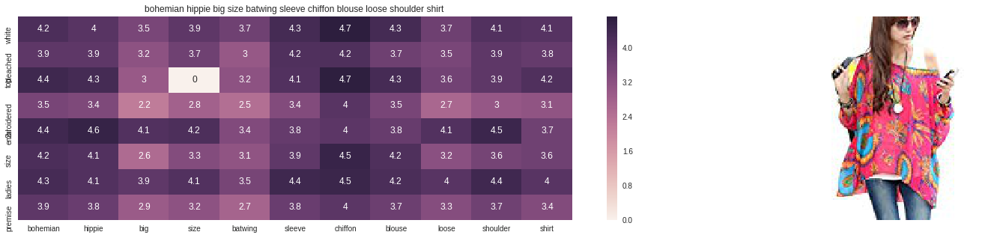

ASIN : B00YC92VRU
Brand : Display Promotion
euclidean distance from input : 48.04646606445313


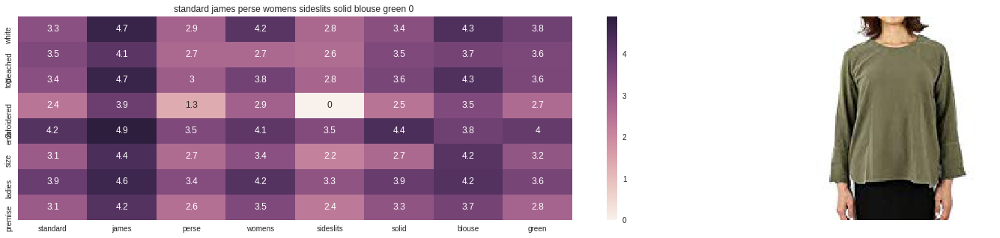

ASIN : B071LMW4YG
Brand : Standard James Perse
euclidean distance from input : 48.101873779296874


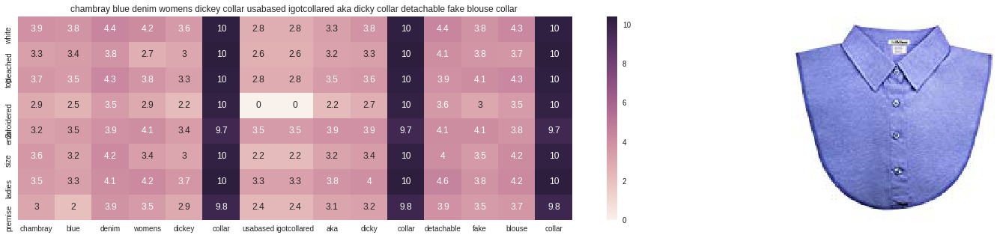

ASIN : B01MQWKWME
Brand : IGotCollared
euclidean distance from input : 48.118896484375


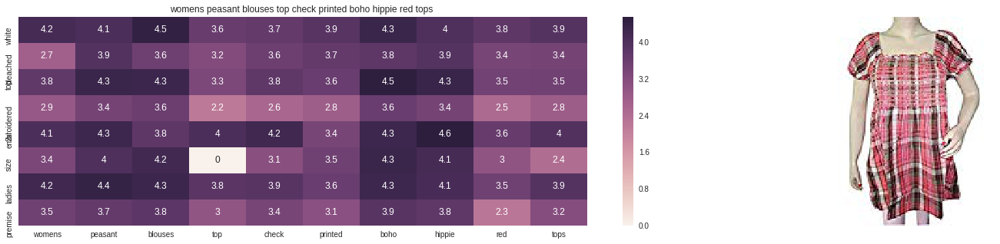

ASIN : B01MXMG6KB
Brand : Mogul Interior
euclidean distance from input : 48.131280517578126


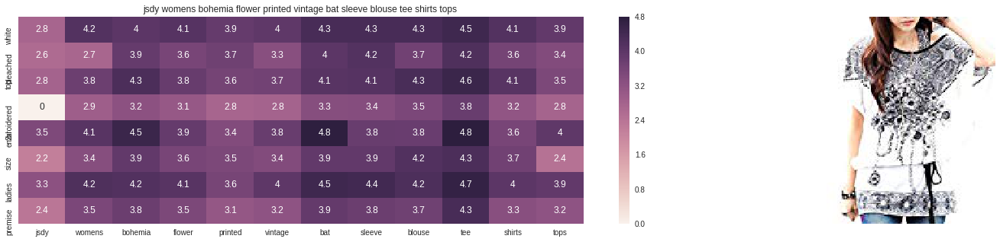

ASIN : B00L8RE3PC
Brand : JSDY-Cloth
euclidean distance from input : 48.16944885253906


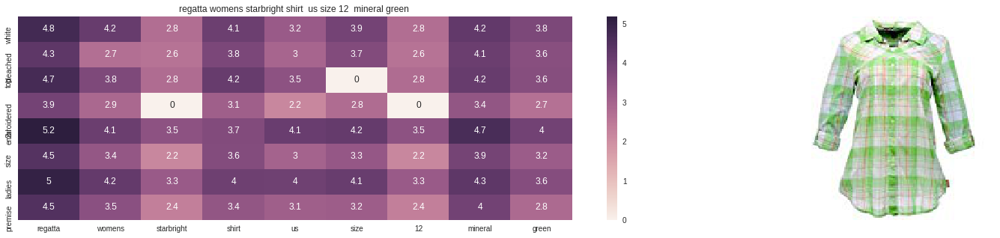

ASIN : B017EC8BOI
Brand : Regatta
euclidean distance from input : 48.256777954101565


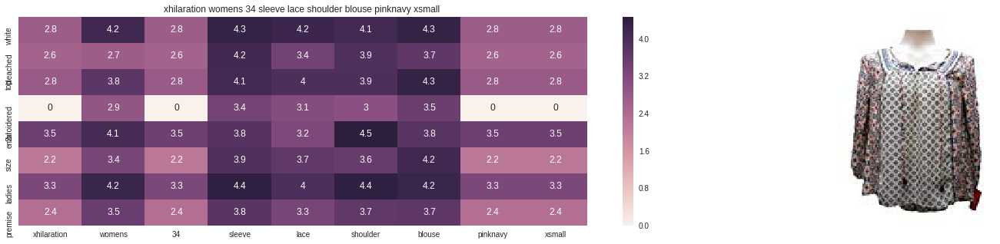

ASIN : B06ZYLKPRT
Brand : Xhilaration
euclidean distance from input : 48.26564331054688


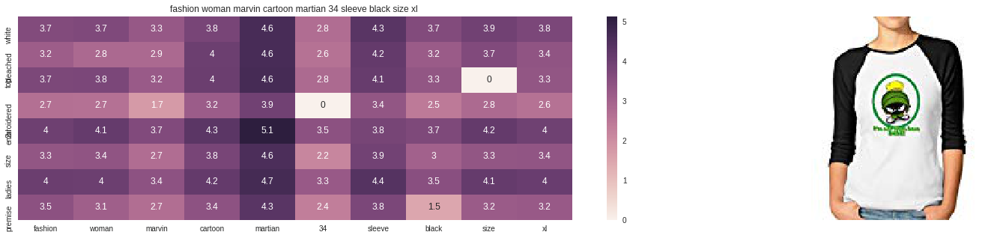

ASIN : B01FRPIX2Y
Brand : LOVELIF Sleeve Raglan
euclidean distance from input : 48.36258239746094


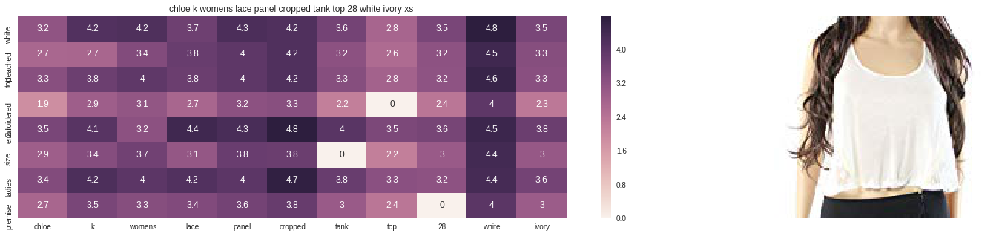

ASIN : B071VZCT5W
Brand : Chloe K.
euclidean distance from input : 48.38364868164062


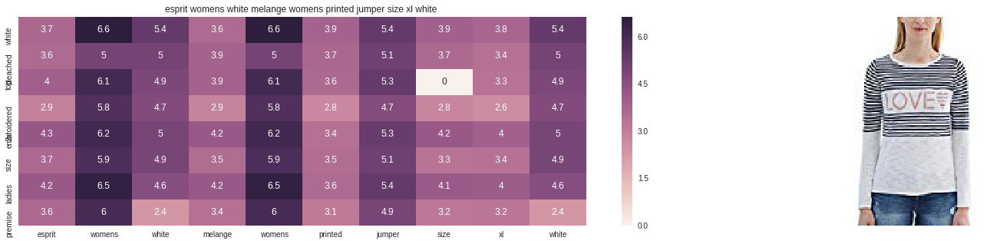

ASIN : B01MSZ1EO7
Brand : Esprit
euclidean distance from input : 48.449343872070315


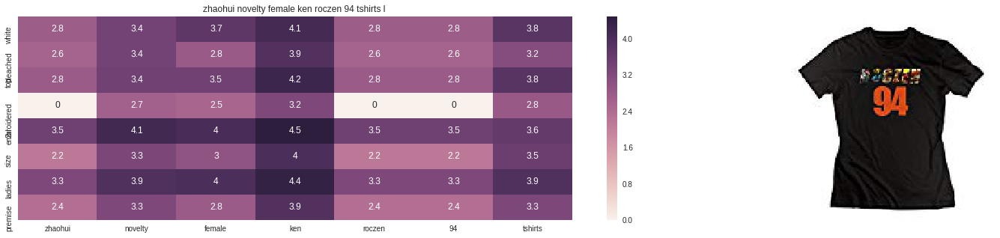

ASIN : B017EEVCV0
Brand : ZhaoHui
euclidean distance from input : 48.47889404296875


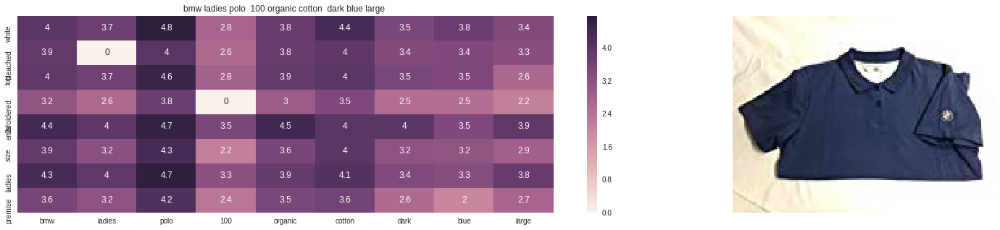

ASIN : B0060MKVX8
Brand : Not given
euclidean distance from input : 48.5579833984375


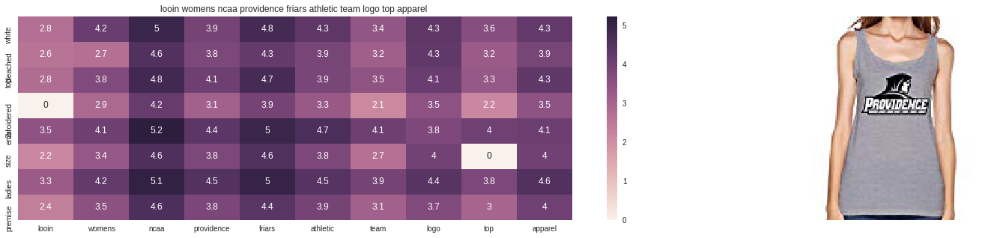

ASIN : B016X0MKA8
Brand : LOOIN Women Top
euclidean distance from input : 48.61439514160156


In [24]:
idf_w2v_brand(12566, 0, 0, 10, 20)

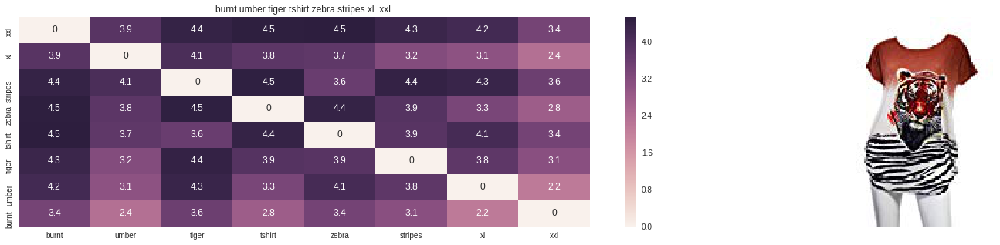

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 0.0


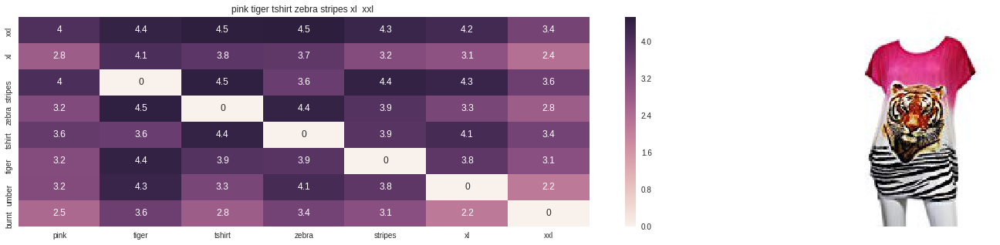

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 0.5891928195953369


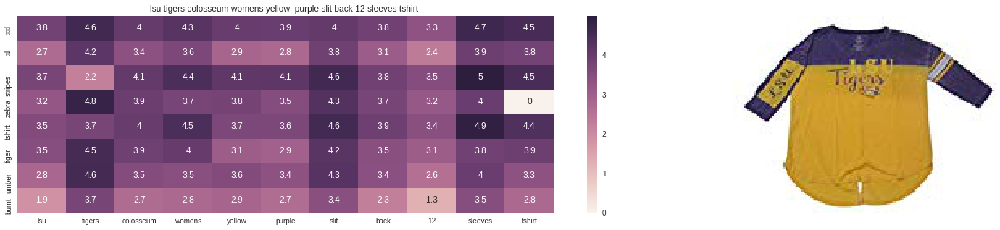

ASIN : B073R5Q8HD
Brand : Colosseum
euclidean distance from input : 1.0229691505432128


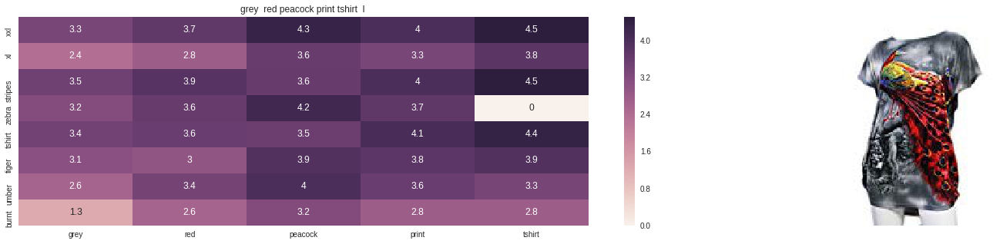

ASIN : B00JXQCFRS
Brand : Si Row
euclidean distance from input : 1.0603532791137695


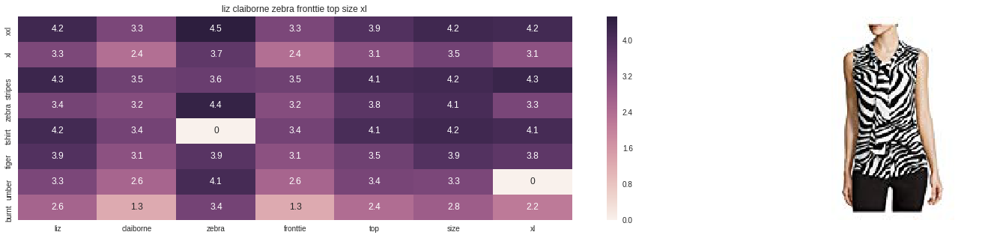

ASIN : B06XBY5QXL
Brand : Liz Claiborne
euclidean distance from input : 1.066932487487793


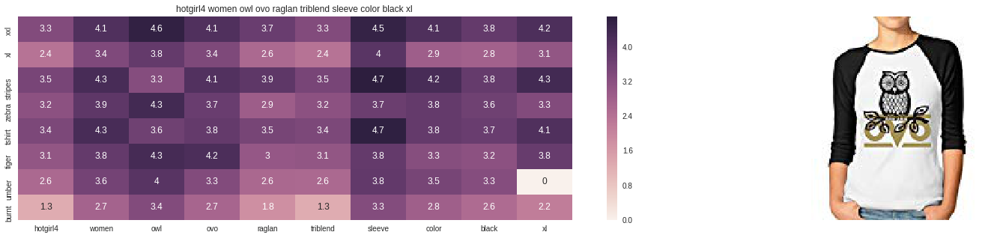

ASIN : B01L8L73M2
Brand : Hotgirl4 Raglan Design
euclidean distance from input : 1.0731406211853027


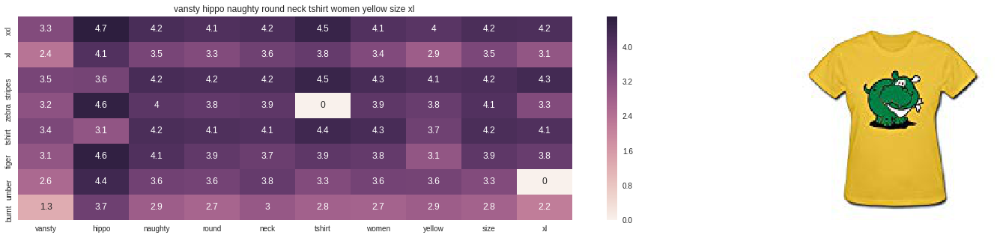

ASIN : B01EJS5H06
Brand : Vansty
euclidean distance from input : 1.0757190704345703


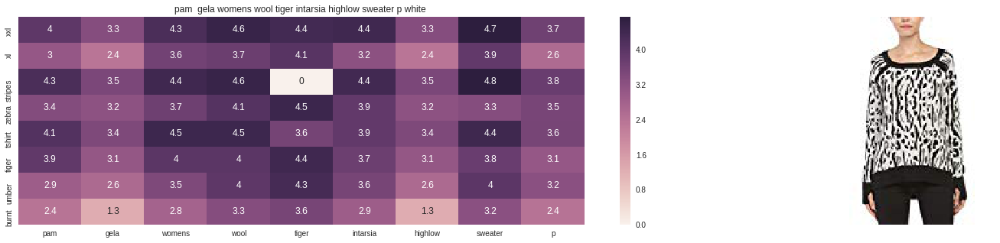

ASIN : B01MPX3HPW
Brand : Pam & Gela
euclidean distance from input : 1.076474952697754


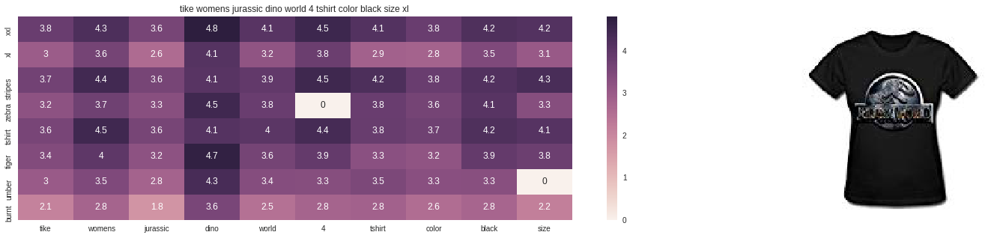

ASIN : B016OPN4OI
Brand : TIKE Fashions
euclidean distance from input : 1.0811142921447754


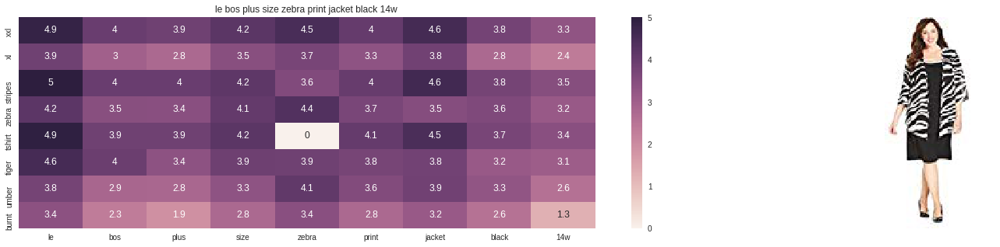

ASIN : B01BO1XRK8
Brand : Le Bos
euclidean distance from input : 1.08399658203125


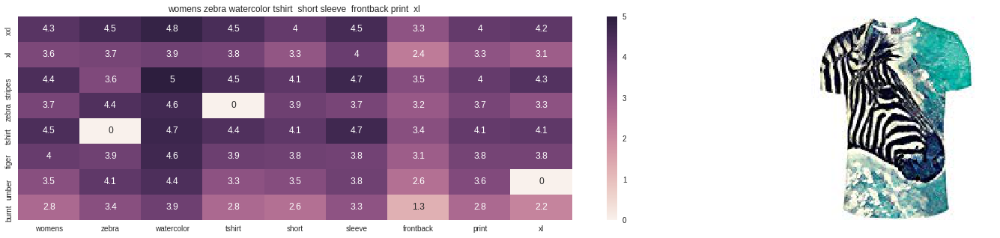

ASIN : B072R2JXKW
Brand : WHAT ON EARTH
euclidean distance from input : 1.0842218399047852


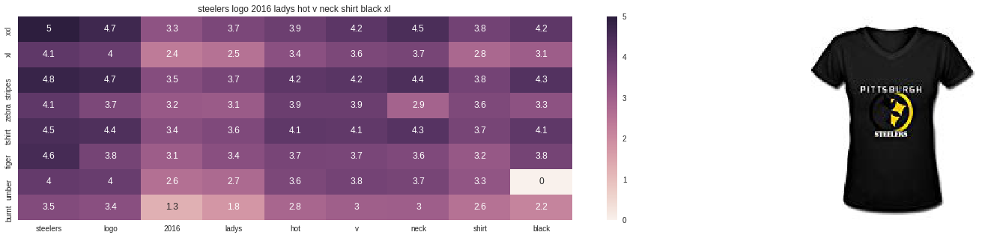

ASIN : B01LX6H2P7
Brand : BOBOB
euclidean distance from input : 1.086540699005127


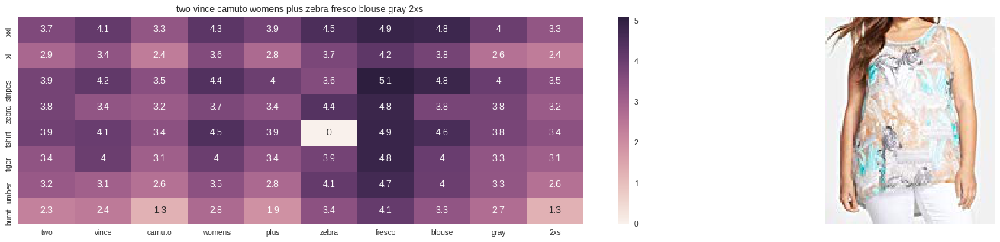

ASIN : B074MJRGW6
Brand : Two by Vince Camuto
euclidean distance from input : 1.089503860473633


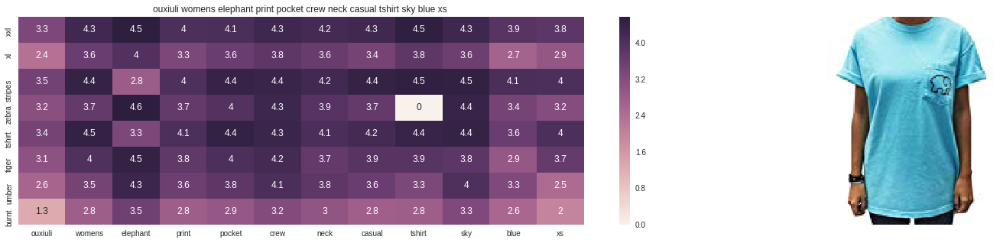

ASIN : B01I53HU6K
Brand : ouxiuli
euclidean distance from input : 1.0920112609863282


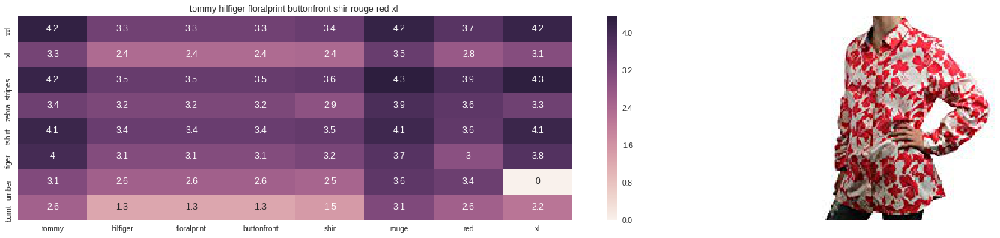

ASIN : B0711NGTQM
Brand : THILFIGER RTW
euclidean distance from input : 1.0923418045043944


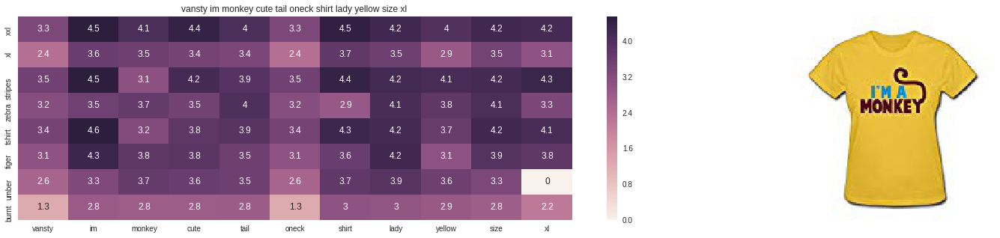

ASIN : B01EFSLO8Y
Brand : Vansty
euclidean distance from input : 1.0934005737304688


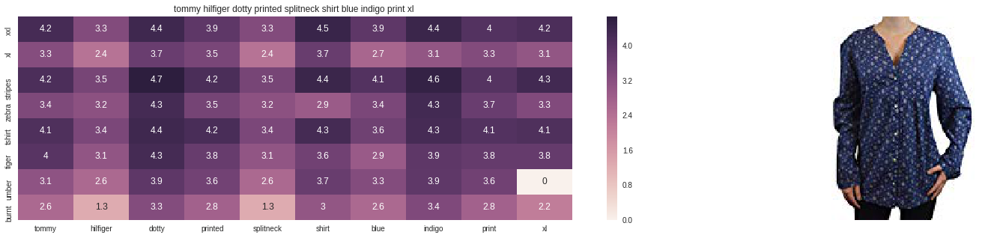

ASIN : B0716TVWQ4
Brand : THILFIGER RTW
euclidean distance from input : 1.0942025184631348


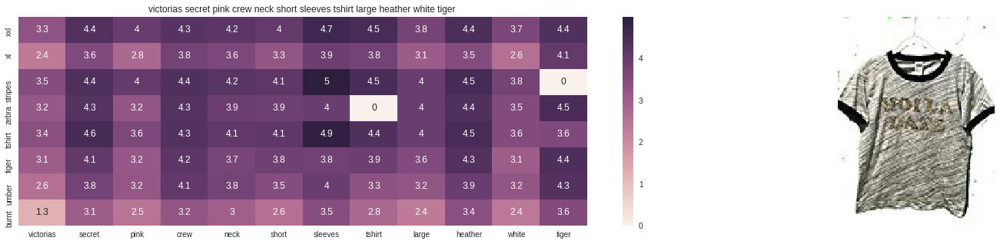

ASIN : B0716MVPGV
Brand : V.Secret
euclidean distance from input : 1.0948305130004883


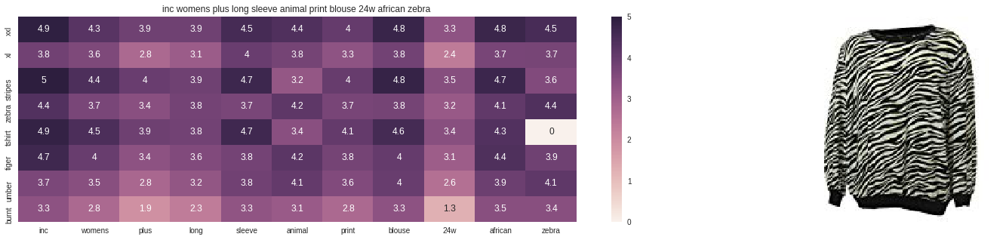

ASIN : B018WDJCUA
Brand : INC - International Concepts Woman
euclidean distance from input : 1.0966893196105958


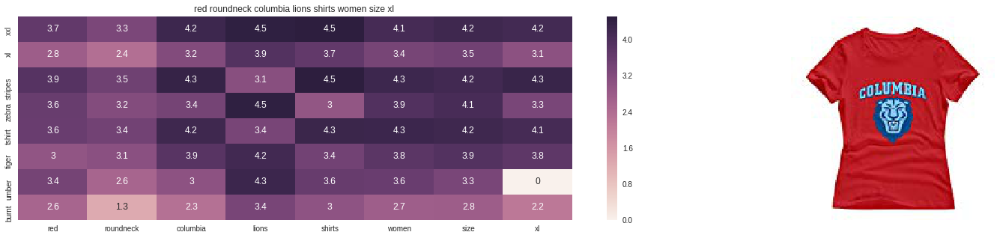

ASIN : B017Q26FDA
Brand : Tavil
euclidean distance from input : 1.0974626541137695


In [25]:
idf_w2v_brand(12566, 10, 0, 0, 20)

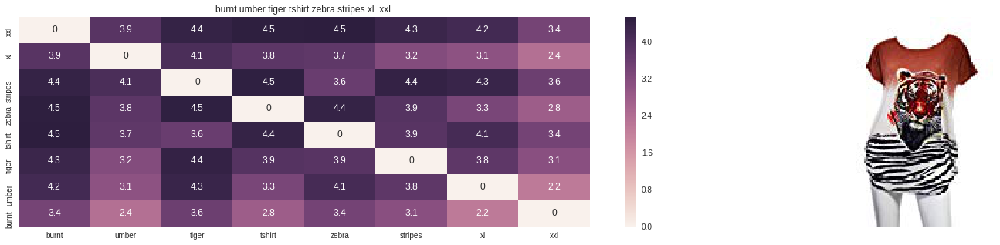

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 0.0


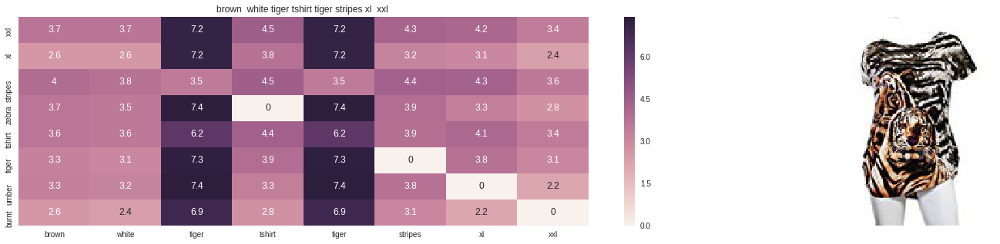

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from input : 0.0


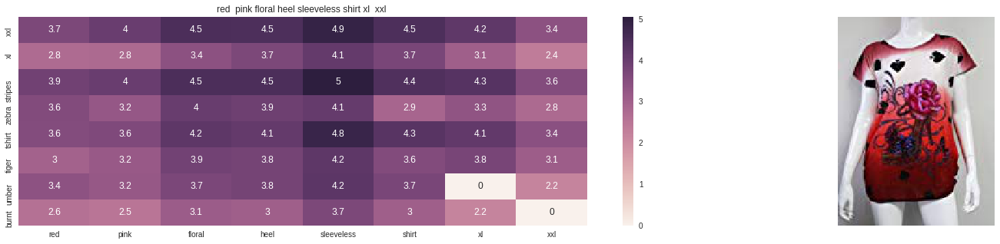

ASIN : B00JV63QQE
Brand : Si Row
euclidean distance from input : 1.4142135623730951


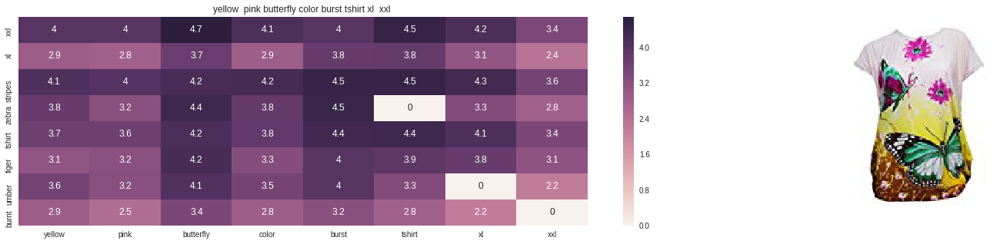

ASIN : B00JXQBBMI
Brand : Si Row
euclidean distance from input : 1.4142135623730951


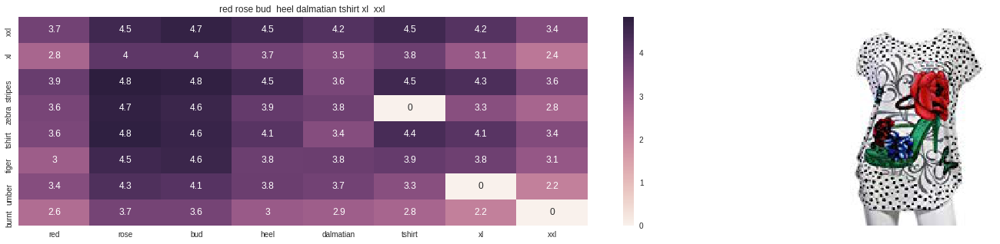

ASIN : B00JXQABB0
Brand : Si Row
euclidean distance from input : 1.4142135623730951


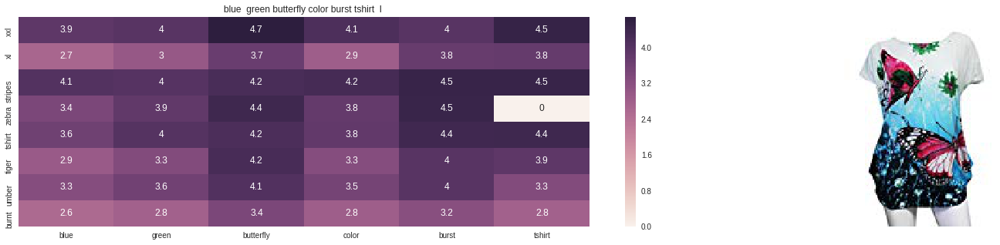

ASIN : B00JXQC0C8
Brand : Si Row
euclidean distance from input : 1.4142135623730951


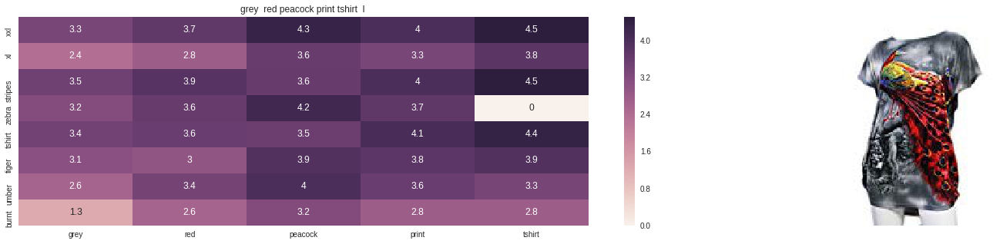

ASIN : B00JXQCFRS
Brand : Si Row
euclidean distance from input : 1.4142135623730951


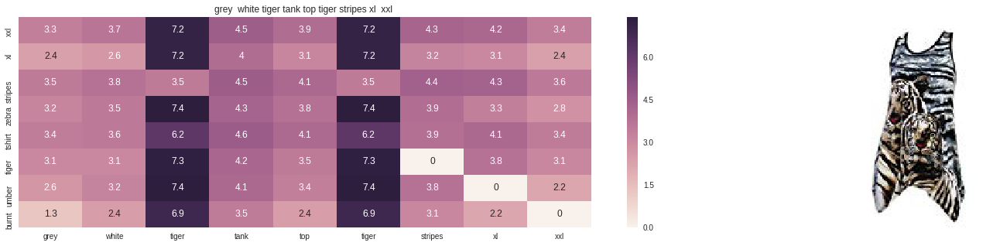

ASIN : B00JXQAFZ2
Brand : Si Row
euclidean distance from input : 1.4142135623730951


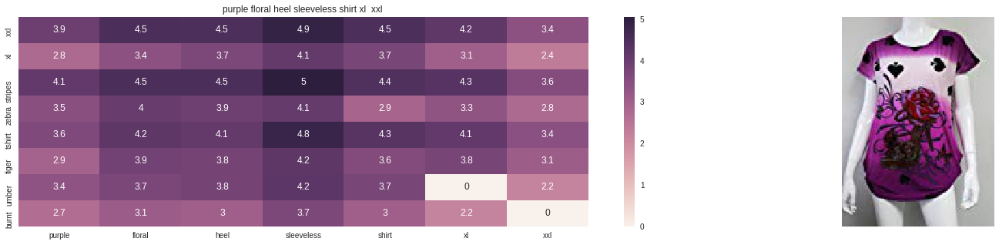

ASIN : B00JV63VC8
Brand : Si Row
euclidean distance from input : 1.4142135623730951


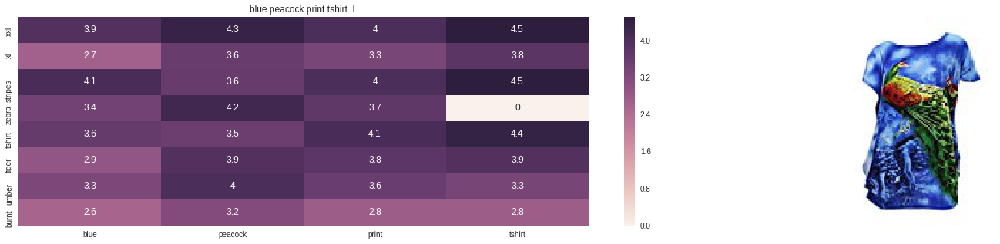

ASIN : B00JXQC8L6
Brand : Si Row
euclidean distance from input : 1.4142135623730951


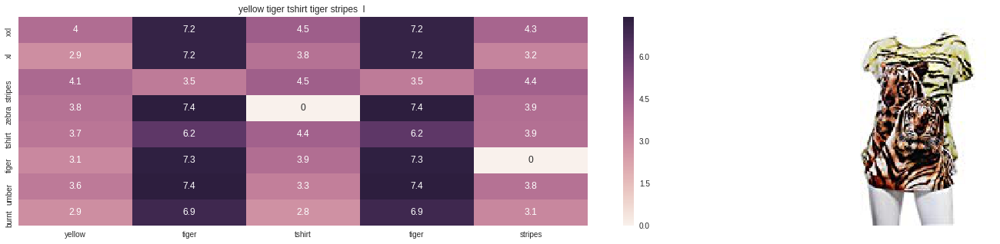

ASIN : B00JXQCUIC
Brand : Si Row
euclidean distance from input : 1.4142135623730951


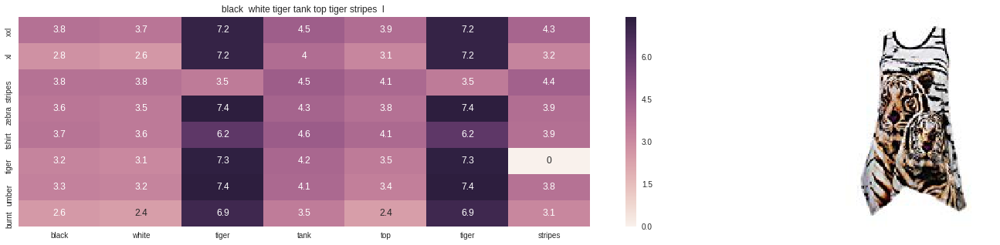

ASIN : B00JXQAO94
Brand : Si Row
euclidean distance from input : 1.4142135623730951


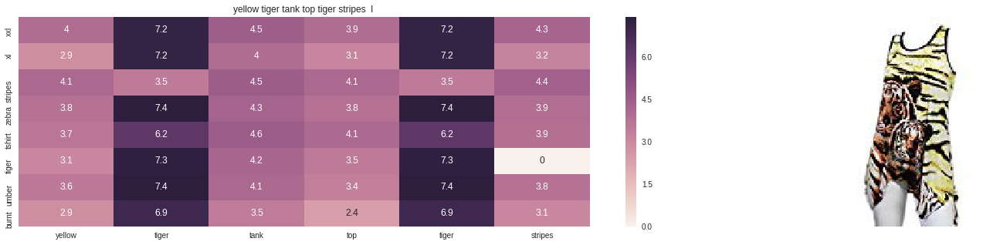

ASIN : B00JXQAUWA
Brand : Si Row
euclidean distance from input : 1.4142135623730951


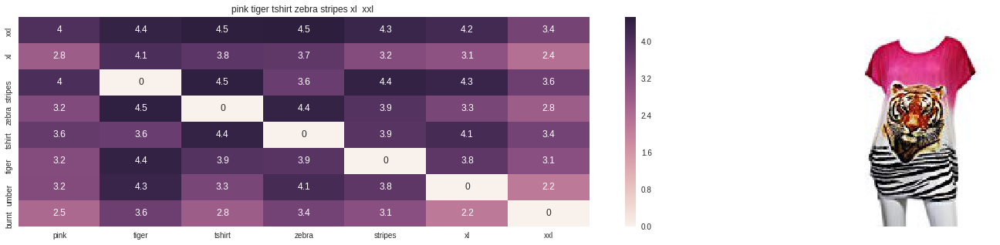

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 1.4142135623730951


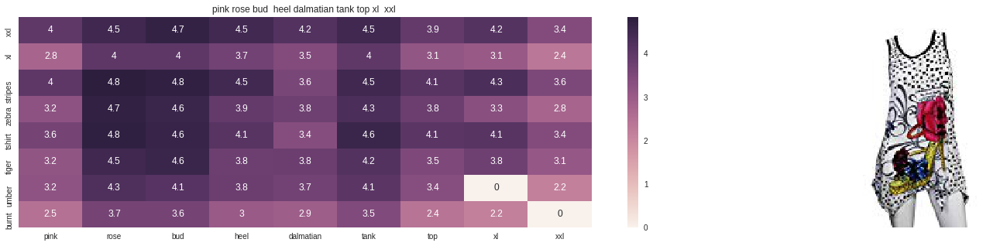

ASIN : B00JXQAX2C
Brand : Si Row
euclidean distance from input : 1.4142135623730951


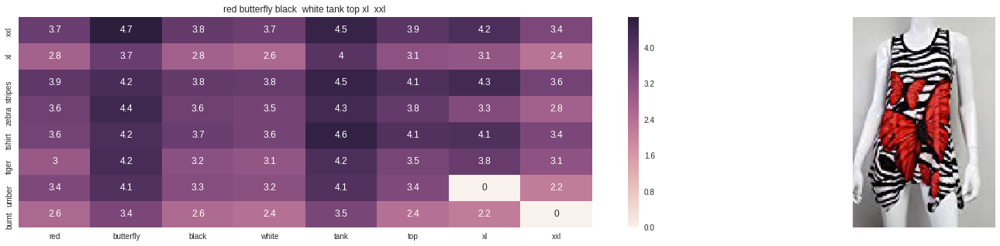

ASIN : B00JV63CW2
Brand : Si Row
euclidean distance from input : 1.4142135623730951


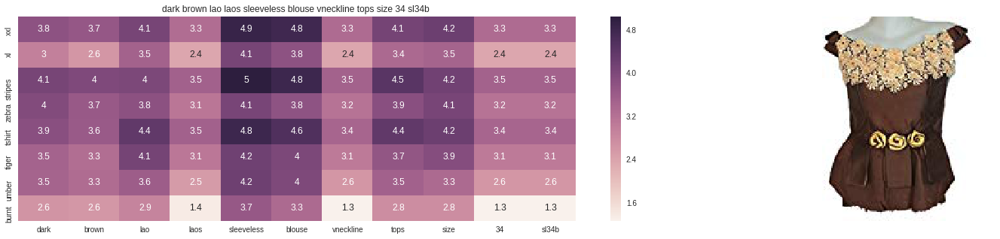

ASIN : B074J48RGW
Brand : Nanon
euclidean distance from input : 2.23606797749979


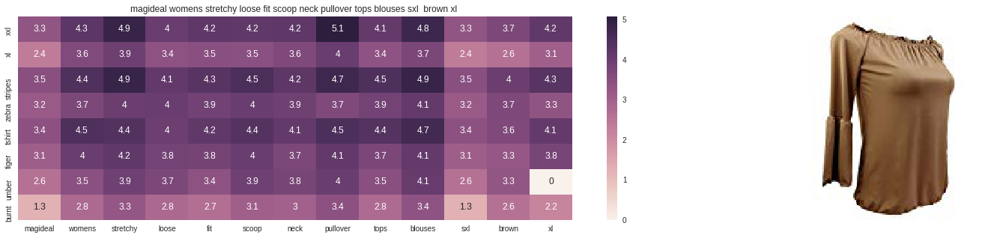

ASIN : B07515JFBF
Brand : MagiDeal
euclidean distance from input : 2.23606797749979


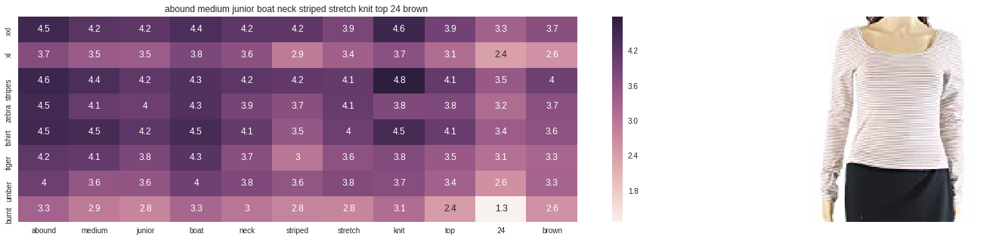

ASIN : B071FQX1CH
Brand : Abound
euclidean distance from input : 2.23606797749979


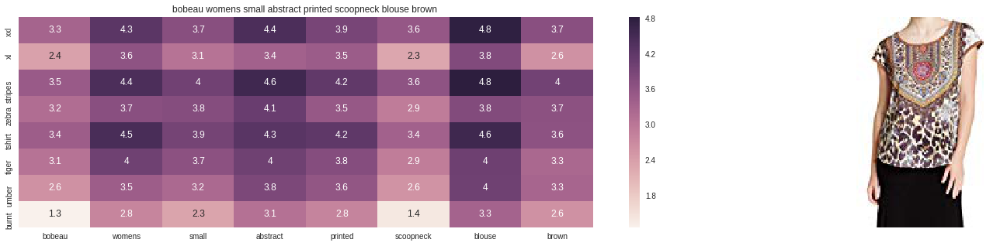

ASIN : B074VCLKJV
Brand : Bobeau
euclidean distance from input : 2.23606797749979


In [26]:
idf_w2v_brand(12566, 0, 10, 0, 20)

# Procedure

STEP 1 :- Load the data 

STEP 2:- As shown in the dataframe threre are various features in there. From al the features we will take brand, color, image and title for modeling.

STEP 3:- For each feature we will apply featurization like IDF values for titles and one_hot_encoding for brand, color and type and stack all one_hot_encoded features in a variable called extra_features.

STEP 4:- After all the featurization,  We will calculate Weighted euclidean distance and find the similarity between the products with the weight value associated with each features.

# Conclusion

1. Created a weighted euclidean distance similarity model with textt, brand, color and image.
2. In the above model each recommendation can be modified by applying weights.
3. Above shown each results is showing different recommendations because of the weight changes according to user prefences. In the last command ***idf_w2v_brand(12566, 0, 0, 10, 20)*** because all the other weights are 0 and only extra-feature weight is 10 so, allthe recommendations are of same brand, color or type.